In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
# Install required packages
!pip install torch torchvision torchaudio
!pip install pandas matplotlib seaborn scikit-learn
!pip install pydicom opencv-python
!pip install tqdm

print("✅ All packages installed successfully!")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 108.4 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 78.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 6.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 82.4 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms, models
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pydicom
from PIL import Image
import cv2
import os
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

print("✅ All libraries imported successfully!")
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

✅ All libraries imported successfully!
PyTorch version: 2.6.0+cu124
CUDA available: True


In [4]:
# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🚀 Using device: {device}")

if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB")

🚀 Using device: cuda
GPU: Tesla T4
GPU Memory: 14.7 GB


In [5]:
# Check what files are available
import os

def list_files(startpath):
    for root, dirs, files in os.walk(startpath):
        level = root.replace(startpath, '').count(os.sep)
        indent = ' ' * 2 * level
        print(f"{indent}{os.path.basename(root)}/")
        subindent = ' ' * 2 * (level + 1)
        for file in files[:5]:  # Show first 5 files
            print(f"{subindent}{file}")
        if len(files) > 5:
            print(f"{subindent}... and {len(files) - 5} more files")

# Check the main directory
print("📁 Checking dataset structure:")
list_files('/kaggle/input')

📁 Checking dataset structure:
input/
  rsna-pneumonia-detection-challenge/
    stage_2_sample_submission.csv
    stage_2_detailed_class_info.csv
    GCP Credits Request Link - RSNA.txt
    stage_2_train_labels.csv
    stage_2_train_images/
      c3b05294-29be-46e4-8a51-96fd211e4ca5.dcm
      6a6ed2c5-d179-4c19-aac7-0d70eb87e024.dcm
      06550cfd-e9d5-415e-bae9-3146329ed9e6.dcm
      ef9eee29-6bdd-41da-ae40-9473592a9d5c.dcm
      c5dfc1a7-4669-42ce-af9f-62c3d8322049.dcm
      ... and 26679 more files
    stage_2_test_images/
      12abc170-f1fe-45d3-b574-2f4d030e40cd.dcm
      2abcf934-facd-40fc-a75e-0062441fd206.dcm
      2da69f80-c59d-4e4a-b7e5-1d631ef4186b.dcm
      13e4e6e6-faa2-4bbc-8e1e-610623de994e.dcm
      2afe02a3-06da-42fa-b68f-3e9c921e5fb9.dcm
      ... and 2995 more files


In [6]:
# Load the training labels and class info
train_labels = pd.read_csv('/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_labels.csv')
class_info = pd.read_csv('/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_detailed_class_info.csv')

print("📊 Dataset Overview:")
print(f"Training labels shape: {train_labels.shape}")
print(f"Class info shape: {class_info.shape}")

print("\n📝 Training Labels - First 5 rows:")
print(train_labels.head())

print("\n🎯 Class Info - First 5 rows:")
print(class_info.head())

📊 Dataset Overview:
Training labels shape: (30227, 6)
Class info shape: (30227, 2)

📝 Training Labels - First 5 rows:
                              patientId      x      y  width  height  Target
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6    NaN    NaN    NaN     NaN       0
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd    NaN    NaN    NaN     NaN       0
2  00322d4d-1c29-4943-afc9-b6754be640eb    NaN    NaN    NaN     NaN       0
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5    NaN    NaN    NaN     NaN       0
4  00436515-870c-4b36-a041-de91049b9ab4  264.0  152.0  213.0   379.0       1

🎯 Class Info - First 5 rows:
                              patientId                         class
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6  No Lung Opacity / Not Normal
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd  No Lung Opacity / Not Normal
2  00322d4d-1c29-4943-afc9-b6754be640eb  No Lung Opacity / Not Normal
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5                        Normal
4  00436515-870c-4b36-a041-de91049b9ab4 

In [7]:
print("🔍 Data Quality Check:")
print("\nTraining Labels Info:")
print(train_labels.info())
print(f"\nMissing values in training labels:")
print(train_labels.isnull().sum())

print(f"\nMissing values in class info:")
print(class_info.isnull().sum())

# Check unique patients
print(f"\nUnique patient IDs in training labels: {train_labels['patientId'].nunique()}")
print(f"Unique patient IDs in class info: {class_info['patientId'].nunique()}")

🔍 Data Quality Check:

Training Labels Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  30227 non-null  object 
 1   x          9555 non-null   float64
 2   y          9555 non-null   float64
 3   width      9555 non-null   float64
 4   height     9555 non-null   float64
 5   Target     30227 non-null  int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 1.4+ MB
None

Missing values in training labels:
patientId        0
x            20672
y            20672
width        20672
height       20672
Target           0
dtype: int64

Missing values in class info:
patientId    0
class        0
dtype: int64

Unique patient IDs in training labels: 26684
Unique patient IDs in class info: 26684


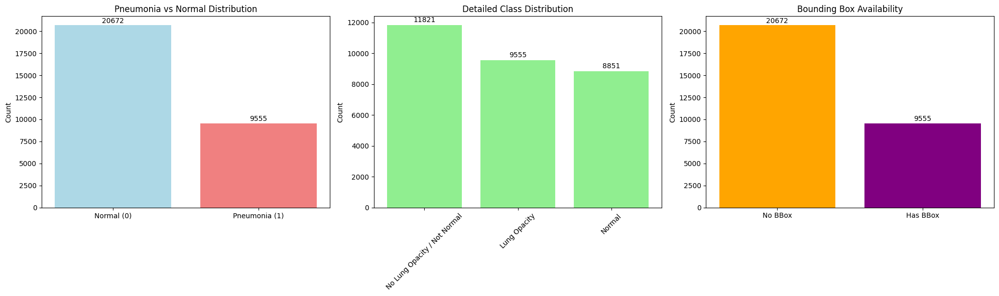

📈 Detailed Statistics:
Total records: 30227
Unique patients: 26684
Pneumonia cases: 9555 (31.61%)
Normal cases: 20672 (68.39%)
Class imbalance ratio: 2.16:1


In [10]:
# Let's create a comprehensive class distribution analysis
plt.figure(figsize=(20, 6))

# Plot 1: Basic target distribution
plt.subplot(1, 3, 1)
target_counts = train_labels['Target'].value_counts()
plt.bar(['Normal (0)', 'Pneumonia (1)'], target_counts.values, color=['lightblue', 'lightcoral'])
plt.title('Pneumonia vs Normal Distribution')
plt.ylabel('Count')
for i, count in enumerate(target_counts.values):
    plt.text(i, count + 100, str(count), ha='center', va='bottom')

# Plot 2: Detailed class distribution
plt.subplot(1, 3, 2)
detailed_counts = class_info['class'].value_counts()
plt.bar(detailed_counts.index, detailed_counts.values, color='lightgreen')
plt.title('Detailed Class Distribution')
plt.ylabel('Count')
plt.xticks(rotation=45)
for i, count in enumerate(detailed_counts.values):
    plt.text(i, count + 100, str(count), ha='center', va='bottom')

# Plot 3: Bounding box availability
plt.subplot(1, 3, 3)
has_bbox = train_labels['x'].notna().value_counts()
plt.bar(['No BBox', 'Has BBox'], has_bbox.values, color=['orange', 'purple'])
plt.title('Bounding Box Availability')
plt.ylabel('Count')
for i, count in enumerate(has_bbox.values):
    plt.text(i, count + 100, str(count), ha='center', va='bottom')

plt.tight_layout()
plt.show()

# Print detailed statistics
print("📈 Detailed Statistics:")
print(f"Total records: {len(train_labels)}")
print(f"Unique patients: {train_labels['patientId'].nunique()}")
print(f"Pneumonia cases: {target_counts[1]} ({target_counts[1]/len(train_labels)*100:.2f}%)")
print(f"Normal cases: {target_counts[0]} ({target_counts[0]/len(train_labels)*100:.2f}%)")
print(f"Class imbalance ratio: {target_counts[0]/target_counts[1]:.2f}:1")

🖼️ Displaying sample chest X-rays:
📐 Image shape: (1024, 1024)
📏 Pixel range: 0 - 255
🏷️ Modality: CR


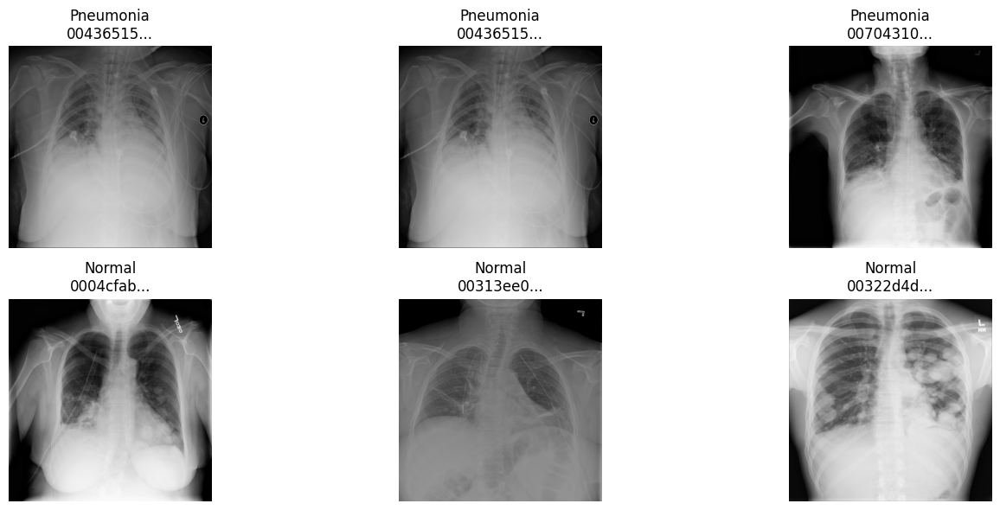

In [11]:
# Function to display sample DICOM images
def show_sample_images(num_samples=6):
    # Get some sample patient IDs from different classes
    pneumonia_samples = train_labels[train_labels['Target'] == 1]['patientId'].head(num_samples//2).tolist()
    normal_samples = train_labels[train_labels['Target'] == 0]['patientId'].head(num_samples//2).tolist()
    
    samples = pneumonia_samples + normal_samples
    labels = ['Pneumonia'] * (num_samples//2) + ['Normal'] * (num_samples//2)
    
    fig, axes = plt.subplots(2, num_samples//2, figsize=(15, 6))
    axes = axes.ravel()
    
    for i, (patient_id, label) in enumerate(zip(samples, labels)):
        # Read DICOM file
        dicom_path = f"/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/{patient_id}.dcm"
        dicom = pydicom.dcmread(dicom_path)
        
        # Convert to numpy array
        image = dicom.pixel_array
        
        # Normalize and convert to uint8
        image = (image - image.min()) / (image.max() - image.min()) * 255.0
        image = image.astype(np.uint8)
        
        # Display
        axes[i].imshow(image, cmap='gray')
        axes[i].set_title(f'{label}\n{patient_id[:8]}...')
        axes[i].axis('off')
        
        # Print some DICOM info for first image
        if i == 0:
            print(f"📐 Image shape: {image.shape}")
            print(f"📏 Pixel range: {image.min()} - {image.max()}")
            print(f"🏷️ Modality: {dicom.Modality if 'Modality' in dicom else 'N/A'}")
    
    plt.tight_layout()
    plt.show()

# Show sample images
print("🖼️ Displaying sample chest X-rays:")
show_sample_images(6)

📏 Checking image dimensions...
Sample image shapes: {(1024, 1024)}
Height range: 1024 - 1024
Width range: 1024 - 1024


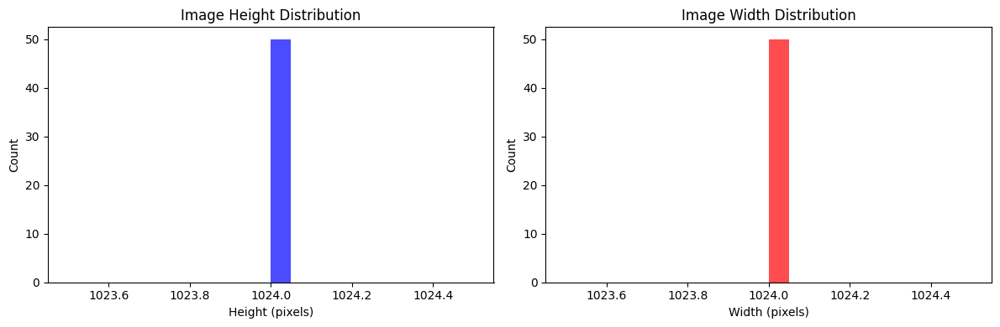

In [12]:
# Let's check the dimensions of a few random images to understand size variation
def check_image_dimensions(sample_size=20):
    print("📏 Checking image dimensions...")
    random_patients = train_labels['patientId'].sample(sample_size)
    
    dimensions = []
    for patient_id in random_patients:
        dicom_path = f"/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/{patient_id}.dcm"
        dicom = pydicom.dcmread(dicom_path)
        dimensions.append(dicom.pixel_array.shape)
    
    dimensions = np.array(dimensions)
    
    print(f"Sample image shapes: {set([tuple(shape) for shape in dimensions])}")
    print(f"Height range: {dimensions[:, 0].min()} - {dimensions[:, 0].max()}")
    print(f"Width range: {dimensions[:, 1].min()} - {dimensions[:, 1].max()}")
    
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.hist(dimensions[:, 0], bins=20, alpha=0.7, color='blue')
    plt.title('Image Height Distribution')
    plt.xlabel('Height (pixels)')
    plt.ylabel('Count')
    
    plt.subplot(1, 2, 2)
    plt.hist(dimensions[:, 1], bins=20, alpha=0.7, color='red')
    plt.title('Image Width Distribution')
    plt.xlabel('Width (pixels)')
    plt.ylabel('Count')
    
    plt.tight_layout()
    plt.show()

check_image_dimensions(50)

In [13]:
# Merge the dataframes
print("🔄 Merging datasets...")
merged_df = train_labels.merge(class_info, on='patientId', how='left')

print(f"Merged dataset shape: {merged_df.shape}")
print("\nFirst few rows of merged data:")
print(merged_df.head())

# Remove duplicates to get one row per patient
print("\n🧹 Removing duplicates...")
clean_df = merged_df.drop_duplicates('patientId')[['patientId', 'Target', 'class']]

print(f"Clean dataset shape: {clean_df.shape}")
print(f"Unique patients: {clean_df['patientId'].nunique()}")

# Check class distribution in clean dataset
print("\n📊 Class distribution in clean dataset:")
print(clean_df['Target'].value_counts())
print(f"\nDetailed class distribution:")
print(clean_df['class'].value_counts())

# Create file paths for all images
clean_df['file_path'] = clean_df['patientId'].apply(
    lambda x: f"/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/{x}.dcm"
)

print(f"\n✅ Clean dataset created with {len(clean_df)} samples")
print(clean_df[['patientId', 'Target', 'class', 'file_path']].head())

🔄 Merging datasets...
Merged dataset shape: (37629, 7)

First few rows of merged data:
                              patientId      x      y  width  height  Target  \
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6    NaN    NaN    NaN     NaN       0   
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd    NaN    NaN    NaN     NaN       0   
2  00322d4d-1c29-4943-afc9-b6754be640eb    NaN    NaN    NaN     NaN       0   
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5    NaN    NaN    NaN     NaN       0   
4  00436515-870c-4b36-a041-de91049b9ab4  264.0  152.0  213.0   379.0       1   

                          class  
0  No Lung Opacity / Not Normal  
1  No Lung Opacity / Not Normal  
2  No Lung Opacity / Not Normal  
3                        Normal  
4                  Lung Opacity  

🧹 Removing duplicates...
Clean dataset shape: (26684, 3)
Unique patients: 26684

📊 Class distribution in clean dataset:
Target
0    20672
1     6012
Name: count, dtype: int64

Detailed class distribution:
class
No Lung Opacity 

⚖️ Class Imbalance Analysis:
Normal cases: 20672
Pneumonia cases: 6012
Imbalance ratio: 3.44:1
Class weights for loss function: tensor([1.0000, 3.4385], dtype=torch.float64)


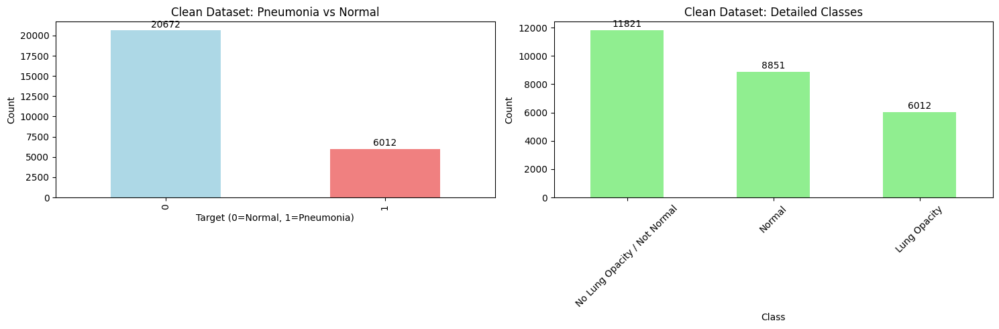

In [14]:
# Calculate class weights for handling imbalance
normal_count = (clean_df['Target'] == 0).sum()
pneumonia_count = (clean_df['Target'] == 1).sum()

print("⚖️ Class Imbalance Analysis:")
print(f"Normal cases: {normal_count}")
print(f"Pneumonia cases: {pneumonia_count}")
print(f"Imbalance ratio: {normal_count/pneumonia_count:.2f}:1")

# We'll use these weights in our loss function later
class_weights = torch.tensor([1.0, normal_count / pneumonia_count])
print(f"Class weights for loss function: {class_weights}")

# Visualize the clean dataset distribution
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
clean_df['Target'].value_counts().plot(kind='bar', color=['lightblue', 'lightcoral'])
plt.title('Clean Dataset: Pneumonia vs Normal')
plt.xlabel('Target (0=Normal, 1=Pneumonia)')
plt.ylabel('Count')
for i, count in enumerate(clean_df['Target'].value_counts().values):
    plt.text(i, count + 100, str(count), ha='center', va='bottom')

plt.subplot(1, 2, 2)
clean_df['class'].value_counts().plot(kind='bar', color='lightgreen')
plt.title('Clean Dataset: Detailed Classes')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45)
for i, count in enumerate(clean_df['class'].value_counts().values):
    plt.text(i, count + 100, str(count), ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [15]:
# Split the data into training and validation sets
from sklearn.model_selection import train_test_split

print("📂 Splitting data into train/validation sets...")

train_df, val_df = train_test_split(
    clean_df, 
    test_size=0.2, 
    random_state=42,
    stratify=clean_df['Target']  # Maintain class distribution in both sets
)

print(f"Training samples: {len(train_df)}")
print(f"Validation samples: {len(val_df)}")

print("\n📊 Training set distribution:")
print(train_df['Target'].value_counts())
print(f"Training set - Normal: {(train_df['Target'] == 0).sum()}, Pneumonia: {(train_df['Target'] == 1).sum()}")

print("\n📊 Validation set distribution:")
print(val_df['Target'].value_counts())
print(f"Validation set - Normal: {(val_df['Target'] == 0).sum()}, Pneumonia: {(val_df['Target'] == 1).sum()}")

# Verify the split maintained the same distribution
train_ratio = (train_df['Target'] == 1).sum() / len(train_df)
val_ratio = (val_df['Target'] == 1).sum() / len(val_df)
original_ratio = (clean_df['Target'] == 1).sum() / len(clean_df)

print(f"\n✅ Distribution check - Pneumonia ratio:")
print(f"Original: {original_ratio:.4f}")
print(f"Training: {train_ratio:.4f}")
print(f"Validation: {val_ratio:.4f}")

📂 Splitting data into train/validation sets...
Training samples: 21347
Validation samples: 5337

📊 Training set distribution:
Target
0    16537
1     4810
Name: count, dtype: int64
Training set - Normal: 16537, Pneumonia: 4810

📊 Validation set distribution:
Target
0    4135
1    1202
Name: count, dtype: int64
Validation set - Normal: 4135, Pneumonia: 1202

✅ Distribution check - Pneumonia ratio:
Original: 0.2253
Training: 0.2253
Validation: 0.2252


In [16]:
# Create a custom dataset class for handling DICOM images
class RSNADataset(Dataset):
    def __init__(self, dataframe, transform=None, is_train=True):
        self.dataframe = dataframe
        self.transform = transform
        self.is_train = is_train
        
    def __len__(self):
        return len(self.dataframe)
    
    def __getitem__(self, idx):
        # Get file path and label
        file_path = self.dataframe.iloc[idx]['file_path']
        label = self.dataframe.iloc[idx]['Target']
        
        try:
            # Read DICOM file
            dicom = pydicom.dcmread(file_path)
            
            # Convert to numpy array
            image = dicom.pixel_array
            
            # Normalize to 0-255 and convert to uint8
            image = (image - image.min()) / (image.max() - image.min()) * 255.0
            image = image.astype(np.uint8)
            
            # Convert to PIL Image for transforms (required by torchvision)
            image = Image.fromarray(image).convert('RGB')
            
            # Apply transforms
            if self.transform:
                image = self.transform(image)
                
            return image, torch.tensor(label, dtype=torch.float32)
            
        except Exception as e:
            print(f"Error loading image {file_path}: {e}")
            # Return a dummy image and label if there's an error
            dummy_image = torch.zeros(3, 224, 224)
            return dummy_image, torch.tensor(0, dtype=torch.float32)

# Define our image transformations
print("🔄 Defining image transformations...")

train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.1, contrast=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                        std=[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                        std=[0.229, 0.224, 0.225])
])

print("✅ Transforms defined successfully!")

🔄 Defining image transformations...
✅ Transforms defined successfully!


In [17]:
# Create datasets
print("📦 Creating datasets...")
train_dataset = RSNADataset(train_df, transform=train_transforms, is_train=True)
val_dataset = RSNADataset(val_df, transform=val_transforms, is_train=False)

print(f"Training dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")

# Handle class imbalance with weighted sampling
print("⚖️ Setting up weighted sampling for class imbalance...")

# Calculate class weights for sampling
class_counts = train_df['Target'].value_counts().sort_index()
class_weights = 1. / class_counts
sample_weights = [class_weights[label] for label in train_df['Target']]

# Create weighted sampler
sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# Create data loaders
print("🚀 Creating data loaders...")

train_loader = DataLoader(
    train_dataset, 
    batch_size=32, 
    sampler=sampler,  # Use weighted sampler for training
    num_workers=2,
    pin_memory=True if torch.cuda.is_available() else False
)

val_loader = DataLoader(
    val_dataset, 
    batch_size=32, 
    shuffle=False,    # No shuffling for validation
    num_workers=2,
    pin_memory=True if torch.cuda.is_available() else False
)

print("✅ Data loaders created successfully!")
print(f"Training batches: {len(train_loader)}")
print(f"Validation batches: {len(val_loader)}")

# Let's test one batch to make sure everything works
print("\n🧪 Testing one batch...")
for images, labels in train_loader:
    print(f"Batch image shape: {images.shape}")
    print(f"Batch labels shape: {labels.shape}")
    print(f"Labels: {labels[:10]}")  # Show first 10 labels
    break

📦 Creating datasets...
Training dataset size: 21347
Validation dataset size: 5337
⚖️ Setting up weighted sampling for class imbalance...
🚀 Creating data loaders...
✅ Data loaders created successfully!
Training batches: 668
Validation batches: 167

🧪 Testing one batch...
Batch image shape: torch.Size([32, 3, 224, 224])
Batch labels shape: torch.Size([32])
Labels: tensor([1., 1., 1., 1., 0., 0., 1., 1., 0., 1.])


🖼️ Displaying sample training batch:


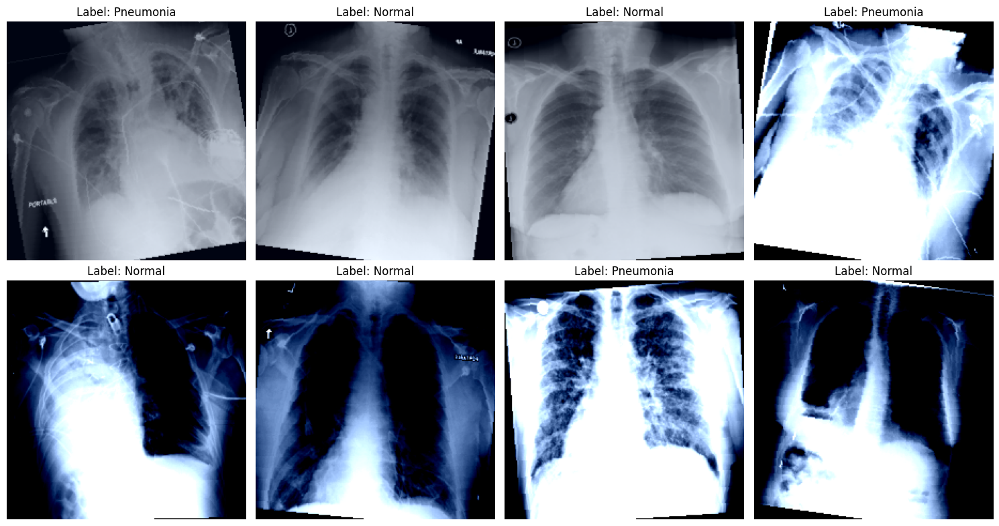

Batch statistics:
Images shape: torch.Size([32, 3, 224, 224])
Labels: tensor([1., 0., 0., 1., 0., 0., 1., 0.])
Pneumonia count in batch: 12
Normal count in batch: 20


In [18]:
# Function to denormalize and display images
def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """Denormalize a tensor image"""
    tensor = tensor.clone()
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor

# Display a sample batch
def show_sample_batch(dataloader, num_images=8):
    dataiter = iter(dataloader)
    images, labels = next(dataiter)
    
    # Denormalize images
    images = denormalize(images)
    
    fig, axes = plt.subplots(2, 4, figsize=(15, 8))
    axes = axes.ravel()
    
    for i in range(num_images):
        # Convert tensor to numpy and display
        img = images[i].permute(1, 2, 0).numpy()
        img = np.clip(img, 0, 1)
        
        axes[i].imshow(img)
        axes[i].set_title(f"Label: {'Pneumonia' if labels[i] == 1 else 'Normal'}")
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"Batch statistics:")
    print(f"Images shape: {images.shape}")
    print(f"Labels: {labels[:num_images]}")
    print(f"Pneumonia count in batch: {(labels == 1).sum().item()}")
    print(f"Normal count in batch: {(labels == 0).sum().item()}")

print("🖼️ Displaying sample training batch:")
show_sample_batch(train_loader)

# Build the Model

In [19]:
import torch.nn as nn
import torchvision.models as models

class PneumoniaClassifier(nn.Module):
    def __init__(self, num_classes=1):
        super(PneumoniaClassifier, self).__init__()
        
        # Use pretrained ResNet18 (good balance of performance and speed)
        self.backbone = models.resnet18(pretrained=True)
        
        # Freeze early layers to prevent overfitting (beginner-friendly)
        print("🔒 Freezing early layers...")
        for param in list(self.backbone.parameters())[:-30]:  # Freeze all but last 30 layers
            param.requires_grad = False
        
        # Replace the final fully connected layer
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Sequential(
            nn.Dropout(0.3),  # Regularization
            nn.Linear(in_features, 512),
            nn.ReLU(),
            nn.Dropout(0.2),  # More regularization
            nn.Linear(512, num_classes)
        )
        
        print(f"✅ Model created with {in_features} input features")
        
    def forward(self, x):
        return self.backbone(x)

# Create model
print("🚀 Creating Pneumonia Classifier...")
model = PneumoniaClassifier(num_classes=1)

# Move model to GPU
model = model.to(device)
print(f"✅ Model moved to: {device}")

# Count trainable parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"📊 Model Parameters:")
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Frozen parameters: {total_params - trainable_params:,}")

# Print model architecture
print("\n🏗️ Model Architecture:")
print(model)

🚀 Creating Pneumonia Classifier...


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 166MB/s] 


🔒 Freezing early layers...
✅ Model created with 512 input features
✅ Model moved to: cuda
📊 Model Parameters:
Total parameters: 11,439,681
Trainable parameters: 10,461,441
Frozen parameters: 978,240

🏗️ Model Architecture:
PneumoniaClassifier(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=

In [20]:
# Define loss function with class weights (for imbalance)
print("⚖️ Setting up loss function with class weights...")

# Use the class weights we calculated earlier
pos_weight = torch.tensor([3.4385]).to(device)  # Weight for pneumonia class
criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)  # Binary classification

# Optimizer (only optimize parameters that require gradients)
optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()), 
    lr=0.001, 
    weight_decay=1e-4
)

# Learning rate scheduler
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

print("✅ Loss function and optimizer set up!")
print(f"Loss function: BCEWithLogitsLoss with pos_weight={pos_weight.item()}")
print(f"Optimizer: Adam (lr=0.001)")
print(f"Scheduler: StepLR (step_size=5, gamma=0.1)")

⚖️ Setting up loss function with class weights...
✅ Loss function and optimizer set up!
Loss function: BCEWithLogitsLoss with pos_weight=3.438499927520752
Optimizer: Adam (lr=0.001)
Scheduler: StepLR (step_size=5, gamma=0.1)


In [21]:
def train_epoch(model, dataloader, criterion, optimizer, device):
    """Train for one epoch"""
    model.train()
    running_loss = 0.0
    all_preds = []
    all_labels = []
    
    # Progress bar
    pbar = tqdm(dataloader, desc="Training")
    
    for batch_idx, (images, labels) in enumerate(pbar):
        images, labels = images.to(device), labels.to(device)
        
        # Zero gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(images)
        loss = criterion(outputs.squeeze(), labels)
        
        # Backward pass
        loss.backward()
        optimizer.step()
        
        # Statistics
        running_loss += loss.item()
        
        # Convert outputs to probabilities and predictions
        with torch.no_grad():
            probs = torch.sigmoid(outputs).cpu().numpy()
            preds = (probs > 0.5).astype(int)
            
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())
        
        # Update progress bar
        pbar.set_postfix({
            'Loss': f'{loss.item():.4f}',
            'Avg Loss': f'{running_loss/(batch_idx+1):.4f}'
        })
    
    epoch_loss = running_loss / len(dataloader)
    epoch_acc = accuracy_score(all_labels, all_preds)
    
    return epoch_loss, epoch_acc

def validate_epoch(model, dataloader, criterion, device):
    """Validate for one epoch"""
    model.eval()
    running_loss = 0.0
    all_preds = []
    all_probs = []
    all_labels = []
    
    with torch.no_grad():
        pbar = tqdm(dataloader, desc="Validation")
        
        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            loss = criterion(outputs.squeeze(), labels)
            
            running_loss += loss.item()
            
            probs = torch.sigmoid(outputs).cpu().numpy()
            preds = (probs > 0.5).astype(int)
            
            all_probs.extend(probs)
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())
            
            # Update progress bar
            pbar.set_postfix({
                'Loss': f'{loss.item():.4f}',
                'Avg Loss': f'{running_loss/(len(all_labels)/len(labels)):.4f}'
            })
    
    epoch_loss = running_loss / len(dataloader)
    epoch_acc = accuracy_score(all_labels, all_preds)
    
    # Calculate AUC
    try:
        epoch_auc = roc_auc_score(all_labels, all_probs)
    except:
        epoch_auc = 0.5
    
    return epoch_loss, epoch_acc, epoch_auc

print("✅ Training functions defined!")

✅ Training functions defined!


In [22]:
# Test the model with one batch to ensure everything works
print("🧪 Testing model with one batch...")

# Get one batch
dataiter = iter(train_loader)
images, labels = next(dataiter)
images, labels = images.to(device), labels.to(device)

# Test forward pass
with torch.no_grad():
    outputs = model(images)
    probs = torch.sigmoid(outputs)
    preds = (probs > 0.5).float()

print(f"Input images shape: {images.shape}")
print(f"Model outputs shape: {outputs.shape}")
print(f"Sample probabilities: {probs[:5].cpu().numpy()}")
print(f"Sample predictions: {preds[:5].cpu().numpy()}")
print(f"True labels: {labels[:5].cpu().numpy()}")

# Test loss calculation
loss = criterion(outputs.squeeze(), labels)
print(f"Test loss: {loss.item():.4f}")

print("✅ Model test successful!")

🧪 Testing model with one batch...
Input images shape: torch.Size([32, 3, 224, 224])
Model outputs shape: torch.Size([32, 1])
Sample probabilities: [[0.48993614]
 [0.5369525 ]
 [0.46503556]
 [0.44138506]
 [0.56558985]]
Sample predictions: [[0.]
 [1.]
 [0.]
 [0.]
 [1.]]
True labels: [0. 1. 1. 1. 1.]
Test loss: 1.5959
✅ Model test successful!


# Train the Model

In [23]:
# Training parameters
num_epochs = 10
best_val_acc = 0.0
best_val_auc = 0.0

# Lists to store metrics
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
val_aucs = []

print("🚀 Starting training...")
print("=" * 60)

for epoch in range(num_epochs):
    print(f'\nEpoch {epoch+1}/{num_epochs}')
    print('-' * 50)
    
    # Train
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)
    
    # Validate
    val_loss, val_acc, val_auc = validate_epoch(model, val_loader, criterion, device)
    
    # Update scheduler
    scheduler.step()
    current_lr = scheduler.get_last_lr()[0]
    
    # Store metrics
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accuracies.append(train_acc)
    val_accuracies.append(val_acc)
    val_aucs.append(val_auc)
    
    # Print epoch results
    print(f'📊 Epoch {epoch+1} Summary:')
    print(f'   Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}')
    print(f'   Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f} | Val AUC: {val_auc:.4f}')
    print(f'   Learning Rate: {current_lr:.6f}')
    
    # Save best model based on validation accuracy
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_acc': val_acc,
            'val_auc': val_auc,
            'train_loss': train_loss,
        }, 'best_pneumonia_model.pth')
        print(f'💾 New best model saved! Validation Accuracy: {val_acc:.4f}')
    
    # Also track best AUC
    if val_auc > best_val_auc:
        best_val_auc = val_auc

print("\n🎉 Training completed!")
print(f"Best Validation Accuracy: {best_val_acc:.4f}")
print(f"Best Validation AUC: {best_val_auc:.4f}")

🚀 Starting training...

Epoch 1/10
--------------------------------------------------


Validation: 100%|██████████| 167/167 [01:04<00:00,  2.58it/s, Loss=1.1618, Avg Loss=0.6322]


📊 Epoch 1 Summary:
   Train Loss: 0.8489 | Train Acc: 0.7099
   Val Loss: 0.8081 | Val Acc: 0.6848 | Val AUC: 0.8664
   Learning Rate: 0.001000
💾 New best model saved! Validation Accuracy: 0.6848

Epoch 2/10
--------------------------------------------------


Validation: 100%|██████████| 167/167 [00:51<00:00,  3.22it/s, Loss=0.9449, Avg Loss=0.7118]


📊 Epoch 2 Summary:
   Train Loss: 0.8011 | Train Acc: 0.7290
   Val Loss: 0.9099 | Val Acc: 0.5589 | Val AUC: 0.8751
   Learning Rate: 0.001000

Epoch 3/10
--------------------------------------------------


Validation: 100%|██████████| 167/167 [00:51<00:00,  3.21it/s, Loss=1.1309, Avg Loss=0.6107]


📊 Epoch 3 Summary:
   Train Loss: 0.7774 | Train Acc: 0.7336
   Val Loss: 0.7807 | Val Acc: 0.6845 | Val AUC: 0.8701
   Learning Rate: 0.001000

Epoch 4/10
--------------------------------------------------


Validation: 100%|██████████| 167/167 [00:51<00:00,  3.24it/s, Loss=0.8570, Avg Loss=0.6116]


📊 Epoch 4 Summary:
   Train Loss: 0.7743 | Train Acc: 0.7379
   Val Loss: 0.7819 | Val Acc: 0.6148 | Val AUC: 0.8708
   Learning Rate: 0.001000

Epoch 5/10
--------------------------------------------------


Validation: 100%|██████████| 167/167 [00:51<00:00,  3.25it/s, Loss=1.1615, Avg Loss=0.6101]


📊 Epoch 5 Summary:
   Train Loss: 0.7664 | Train Acc: 0.7448
   Val Loss: 0.7799 | Val Acc: 0.7253 | Val AUC: 0.8744
   Learning Rate: 0.000100
💾 New best model saved! Validation Accuracy: 0.7253

Epoch 6/10
--------------------------------------------------


Validation: 100%|██████████| 167/167 [00:50<00:00,  3.32it/s, Loss=1.1685, Avg Loss=0.5944]


📊 Epoch 6 Summary:
   Train Loss: 0.7171 | Train Acc: 0.7624
   Val Loss: 0.7598 | Val Acc: 0.7083 | Val AUC: 0.8773
   Learning Rate: 0.000100

Epoch 7/10
--------------------------------------------------


Validation: 100%|██████████| 167/167 [00:52<00:00,  3.18it/s, Loss=1.0007, Avg Loss=0.6776]


📊 Epoch 7 Summary:
   Train Loss: 0.7089 | Train Acc: 0.7629
   Val Loss: 0.8662 | Val Acc: 0.6331 | Val AUC: 0.8770
   Learning Rate: 0.000100

Epoch 8/10
--------------------------------------------------


Validation: 100%|██████████| 167/167 [00:53<00:00,  3.15it/s, Loss=1.0779, Avg Loss=0.6200]


📊 Epoch 8 Summary:
   Train Loss: 0.6970 | Train Acc: 0.7711
   Val Loss: 0.7925 | Val Acc: 0.6715 | Val AUC: 0.8769
   Learning Rate: 0.000100

Epoch 9/10
--------------------------------------------------


Validation: 100%|██████████| 167/167 [00:52<00:00,  3.18it/s, Loss=1.0000, Avg Loss=0.6000]


📊 Epoch 9 Summary:
   Train Loss: 0.6912 | Train Acc: 0.7702
   Val Loss: 0.7670 | Val Acc: 0.6963 | Val AUC: 0.8765
   Learning Rate: 0.000100

Epoch 10/10
--------------------------------------------------


Validation: 100%|██████████| 167/167 [00:52<00:00,  3.21it/s, Loss=1.0903, Avg Loss=0.6248]

📊 Epoch 10 Summary:
   Train Loss: 0.6608 | Train Acc: 0.7822
   Val Loss: 0.7987 | Val Acc: 0.6779 | Val AUC: 0.8755
   Learning Rate: 0.000010

🎉 Training completed!
Best Validation Accuracy: 0.7253
Best Validation AUC: 0.8773


🚀 Loading the best model for evaluation...
✅ Best model loaded from epoch 5
Best validation accuracy: 0.7253
Best validation AUC: 0.8744


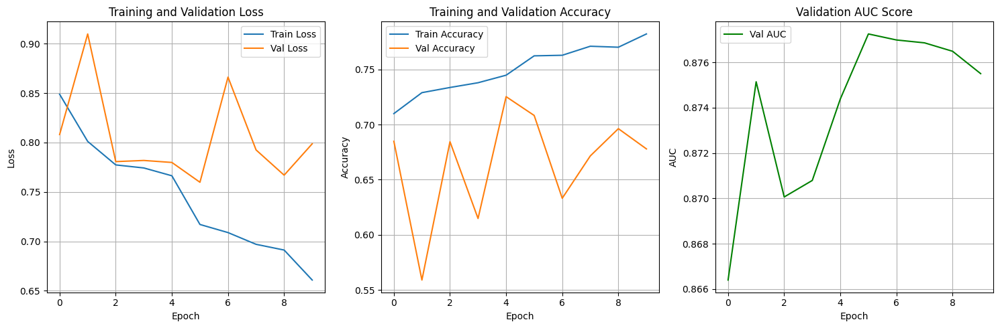

📈 Training History:
Final Training Loss: 0.6608
Final Validation Loss: 0.7987
Final Training Accuracy: 0.7822
Final Validation Accuracy: 0.6779
Final Validation AUC: 0.8755


In [28]:
# Load the best model
print("🚀 Loading the best model for evaluation...")


checkpoint = torch.load('best_pneumonia_model.pth', weights_only=False, map_location='cpu')
model.load_state_dict(checkpoint['model_state_dict'])

print(f"✅ Best model loaded from epoch {checkpoint['epoch'] + 1}")
print(f"Best validation accuracy: {checkpoint['val_acc']:.4f}")
print(f"Best validation AUC: {checkpoint['val_auc']:.4f}")

# Plot training history
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(val_accuracies, label='Val Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(val_aucs, label='Val AUC', color='green')
plt.title('Validation AUC Score')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

print("📈 Training History:")
print(f"Final Training Loss: {train_losses[-1]:.4f}")
print(f"Final Validation Loss: {val_losses[-1]:.4f}")
print(f"Final Training Accuracy: {train_accuracies[-1]:.4f}")
print(f"Final Validation Accuracy: {val_accuracies[-1]:.4f}")
print(f"Final Validation AUC: {val_aucs[-1]:.4f}")

🔍 Running comprehensive evaluation...


Evaluating: 100%|██████████| 167/167 [00:50<00:00,  3.31it/s]



📝 Classification Report:
              precision    recall  f1-score   support

      Normal       0.95      0.68      0.79      4135
   Pneumonia       0.44      0.88      0.59      1202

    accuracy                           0.73      5337
   macro avg       0.70      0.78      0.69      5337
weighted avg       0.84      0.73      0.75      5337



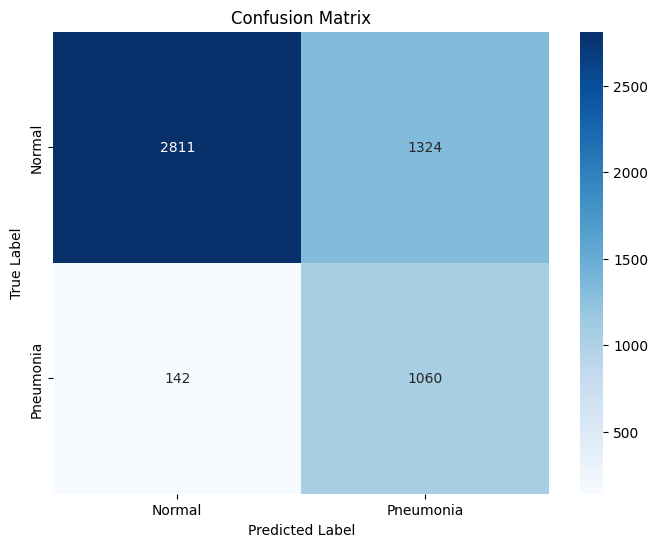

🎯 Detailed Performance Metrics:
Sensitivity (Recall): 0.8819
Specificity: 0.6798
Precision: 0.4446
F1-Score: 0.5912
Accuracy: 0.7253
AUC: 0.8744


In [29]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, precision_recall_curve

def evaluate_model_comprehensive(model, dataloader, device):
    """Comprehensive model evaluation"""
    model.eval()
    all_preds = []
    all_probs = []
    all_labels = []
    
    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Evaluating"):
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            probs = torch.sigmoid(outputs).cpu().numpy()
            preds = (probs > 0.5).astype(int)
            
            all_probs.extend(probs)
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())
    
    return np.array(all_labels), np.array(all_preds), np.array(all_probs)

print("🔍 Running comprehensive evaluation...")
true_labels, predictions, probabilities = evaluate_model_comprehensive(model, val_loader, device)

# Classification Report
print("\n📝 Classification Report:")
print(classification_report(true_labels, predictions, target_names=['Normal', 'Pneumonia']))

# Confusion Matrix
cm = confusion_matrix(true_labels, predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Normal', 'Pneumonia'], 
            yticklabels=['Normal', 'Pneumonia'])
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Calculate additional metrics
tn, fp, fn, tp = cm.ravel()
sensitivity = tp / (tp + fn)  # Recall for positive class
specificity = tn / (tn + fp)  # Recall for negative class
precision = tp / (tp + fp)
f1 = 2 * (precision * sensitivity) / (precision + sensitivity)

print("🎯 Detailed Performance Metrics:")
print(f"Sensitivity (Recall): {sensitivity:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1-Score: {f1:.4f}")
print(f"Accuracy: {accuracy_score(true_labels, predictions):.4f}")
print(f"AUC: {roc_auc_score(true_labels, probabilities):.4f}")

🔍 Running comprehensive evaluation...


Evaluating: 100%|██████████| 167/167 [00:51<00:00,  3.22it/s]



📝 Classification Report:
              precision    recall  f1-score   support

      Normal       0.95      0.68      0.79      4135
   Pneumonia       0.44      0.88      0.59      1202

    accuracy                           0.73      5337
   macro avg       0.70      0.78      0.69      5337
weighted avg       0.84      0.73      0.75      5337



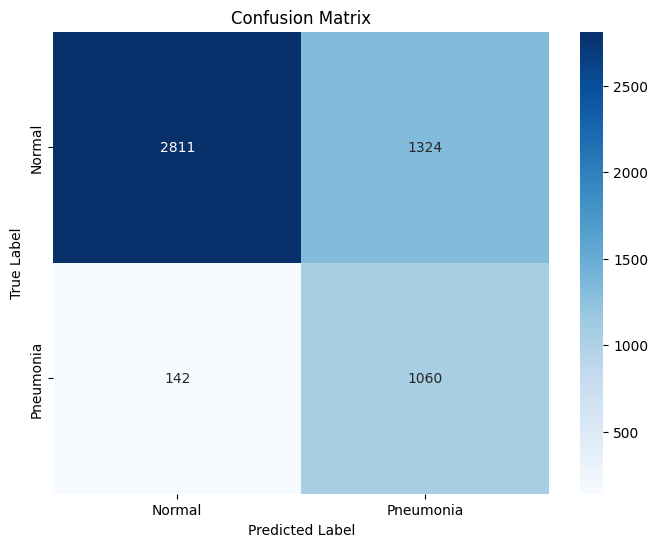

🎯 Detailed Performance Metrics:
Sensitivity (Recall): 0.8819
Specificity: 0.6798
Precision: 0.4446
F1-Score: 0.5912
Accuracy: 0.7253
AUC: 0.8744


In [31]:
from sklearn.metrics import average_precision_score, precision_recall_curve

# Now let's re-run the evaluation with the proper imports
print("🔍 Running comprehensive evaluation...")
true_labels, predictions, probabilities = evaluate_model_comprehensive(model, val_loader, device)

# Classification Report
print("\n📝 Classification Report:")
print(classification_report(true_labels, predictions, target_names=['Normal', 'Pneumonia']))

# Confusion Matrix
cm = confusion_matrix(true_labels, predictions)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Normal', 'Pneumonia'], 
            yticklabels=['Normal', 'Pneumonia'])
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Calculate additional metrics
tn, fp, fn, tp = cm.ravel()
sensitivity = tp / (tp + fn)  # Recall for positive class
specificity = tn / (tn + fp)  # Recall for negative class
precision = tp / (tp + fp)
f1 = 2 * (precision * sensitivity) / (precision + sensitivity)

print("🎯 Detailed Performance Metrics:")
print(f"Sensitivity (Recall): {sensitivity:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"Precision: {precision:.4f}")
print(f"F1-Score: {f1:.4f}")
print(f"Accuracy: {accuracy_score(true_labels, predictions):.4f}")
print(f"AUC: {roc_auc_score(true_labels, probabilities):.4f}")

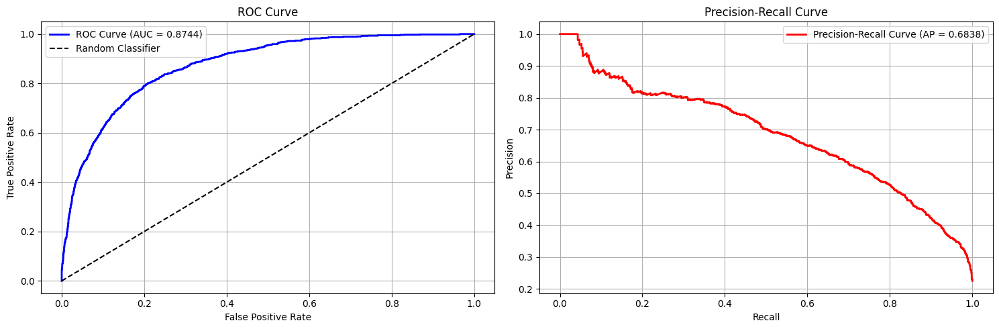

📊 Curve Metrics:
ROC AUC: 0.8744
Average Precision: 0.6838


In [33]:
# ROC Curve
fpr, tpr, thresholds = roc_curve(true_labels, probabilities)
auc_score = roc_auc_score(true_labels, probabilities)

# Precision-Recall Curve
precision_curve, recall_curve, _ = precision_recall_curve(true_labels, probabilities)
avg_precision = average_precision_score(true_labels, probabilities)

plt.figure(figsize=(15, 5))

# ROC Curve
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {auc_score:.4f})', color='blue', linewidth=2)
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.grid(True)

# Precision-Recall Curve
plt.subplot(1, 2, 2)
plt.plot(recall_curve, precision_curve, label=f'Precision-Recall Curve (AP = {avg_precision:.4f})', 
         color='red', linewidth=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

print(f"📊 Curve Metrics:")
print(f"ROC AUC: {auc_score:.4f}")
print(f"Average Precision: {avg_precision:.4f}")

🔍 Optimal threshold analysis:
Default threshold: 0.5
Optimal threshold (Youden's J): 0.7284
Accuracy with default threshold (0.5): 0.7253
Accuracy with optimal threshold (0.7284): 0.7931


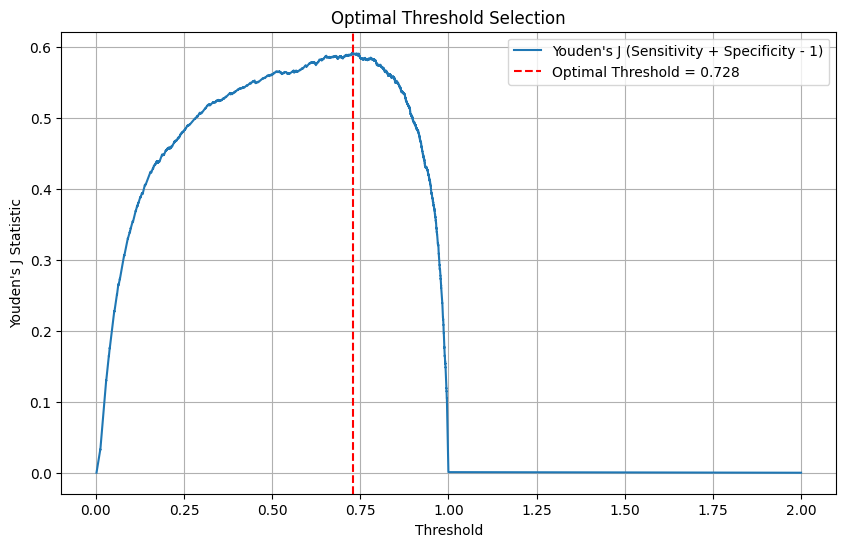

In [34]:
# Find optimal threshold using Youden's J statistic
youden_j = tpr - fpr
optimal_idx = np.argmax(youden_j)
optimal_threshold = thresholds[optimal_idx]

print(f"🔍 Optimal threshold analysis:")
print(f"Default threshold: 0.5")
print(f"Optimal threshold (Youden's J): {optimal_threshold:.4f}")

# Evaluate with optimal threshold
optimal_predictions = (probabilities > optimal_threshold).astype(int)
optimal_accuracy = accuracy_score(true_labels, optimal_predictions)

print(f"Accuracy with default threshold (0.5): {accuracy_score(true_labels, predictions):.4f}")
print(f"Accuracy with optimal threshold ({optimal_threshold:.4f}): {optimal_accuracy:.4f}")

# Plot threshold analysis
plt.figure(figsize=(10, 6))
plt.plot(thresholds, youden_j, label="Youden's J (Sensitivity + Specificity - 1)")
plt.axvline(x=optimal_threshold, color='red', linestyle='--', label=f'Optimal Threshold = {optimal_threshold:.3f}')
plt.xlabel('Threshold')
plt.ylabel("Youden's J Statistic")
plt.title('Optimal Threshold Selection')
plt.legend()
plt.grid(True)
plt.show()

In [35]:
# Save the complete model for deployment
torch.save({
    'model_state_dict': model.state_dict(),
    'class_names': ['Normal', 'Pneumonia'],
    'input_size': 224,
    'mean': [0.485, 0.456, 0.406],
    'std': [0.229, 0.224, 0.225],
    'optimal_threshold': optimal_threshold,
    'performance_metrics': {
        'auc': auc_score,
        'accuracy': accuracy_score(true_labels, predictions),
        'sensitivity': sensitivity,
        'specificity': specificity,
        'f1_score': f1,
        'average_precision': avg_precision
    }
}, 'pneumonia_classifier_complete.pth')

print("✅ Model saved for deployment!")

# Also save as Script for potential mobile deployment
try:
    model_scripted = torch.jit.script(model)
    model_scripted.save('pneumonia_classifier_scripted.pt')
    print("✅ Scripted model saved!")
except Exception as e:
    print(f"⚠️ Could not save scripted model: {e}")

✅ Model saved for deployment!
✅ Scripted model saved!


In [36]:
def predict_pneumonia(image_path, model, device, threshold=0.5):
    """Predict pneumonia from a DICOM image"""
    try:
        # Read DICOM file
        dicom = pydicom.dcmread(image_path)
        image = dicom.pixel_array
        
        # Preprocess
        image = (image - image.min()) / (image.max() - image.min()) * 255.0
        image = image.astype(np.uint8)
        image = Image.fromarray(image).convert('RGB')
        
        # Transform
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                               std=[0.229, 0.224, 0.225])
        ])
        
        input_tensor = transform(image).unsqueeze(0).to(device)
        
        # Predict
        model.eval()
        with torch.no_grad():
            output = model(input_tensor)
            probability = torch.sigmoid(output).item()
            prediction = 1 if probability > threshold else 0
        
        return {
            'prediction': 'Pneumonia' if prediction == 1 else 'Normal',
            'probability': probability,
            'confidence': f"{probability:.1%}" if prediction == 1 else f"{(1-probability):.1%}"
        }
    except Exception as e:
        return {'error': str(e)}

# Test the inference function
print("🧪 Testing inference on a sample image...")
sample_image_path = val_df.iloc[0]['file_path']
result = predict_pneumonia(sample_image_path, model, device)
print(f"Sample prediction: {result}")

# Test on a few more samples
print("\n🔍 Testing on a few validation samples:")
correct_predictions = 0
total_predictions = 5

for i in range(total_predictions):
    sample = val_df.iloc[i]
    result = predict_pneumonia(sample['file_path'], model, device)
    true_label = 'Pneumonia' if sample['Target'] == 1 else 'Normal'
    correct = '✅' if result['prediction'] == true_label else '❌'
    if result['prediction'] == true_label:
        correct_predictions += 1
    print(f"{correct} True: {true_label:8} | Pred: {result['prediction']:8} | Prob: {result['probability']:.3f} | Conf: {result['confidence']}")

print(f"\n🎯 Sample Test Accuracy: {correct_predictions}/{total_predictions} ({correct_predictions/total_predictions:.1%})")

🧪 Testing inference on a sample image...
Sample prediction: {'prediction': 'Normal', 'probability': 0.3735702335834503, 'confidence': '62.6%'}

🔍 Testing on a few validation samples:
✅ True: Normal   | Pred: Normal   | Prob: 0.374 | Conf: 62.6%
❌ True: Normal   | Pred: Pneumonia | Prob: 0.868 | Conf: 86.8%
✅ True: Pneumonia | Pred: Pneumonia | Prob: 0.979 | Conf: 97.9%
✅ True: Normal   | Pred: Normal   | Prob: 0.005 | Conf: 99.5%
✅ True: Pneumonia | Pred: Pneumonia | Prob: 0.917 | Conf: 91.7%

🎯 Sample Test Accuracy: 4/5 (80.0%)


In [37]:
# Let's train for more epochs with better monitoring
import time
from datetime import datetime

def train_with_early_stopping(model, train_loader, val_loader, criterion, optimizer, device, max_epochs=20, patience=5):
    """Train with early stopping to prevent overfitting"""
    
    best_val_auc = 0.0
    best_val_acc = 0.0
    epochs_no_improve = 0
    training_history = []
    
    # Enhanced scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2, verbose=True)
    
    print("🚀 Starting enhanced training with early stopping...")
    start_time = time.time()
    
    for epoch in range(max_epochs):
        epoch_start = time.time()
        
        # Train
        train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)
        
        # Validate
        val_loss, val_acc, val_auc = validate_epoch(model, val_loader, criterion, device)
        
        # Update scheduler based on validation AUC
        scheduler.step(val_auc)
        current_lr = optimizer.param_groups[0]['lr']
        
        # Store history
        epoch_time = time.time() - epoch_start
        training_history.append({
            'epoch': epoch + 1,
            'train_loss': train_loss,
            'val_loss': val_loss,
            'train_acc': train_acc,
            'val_acc': val_acc,
            'val_auc': val_auc,
            'lr': current_lr,
            'time': epoch_time
        })
        
        # Print detailed results
        print(f'\n📊 Epoch {epoch+1}/{max_epochs} (Time: {epoch_time:.1f}s)')
        print(f'   Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}')
        print(f'   Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f} | Val AUC: {val_auc:.4f}')
        print(f'   Learning Rate: {current_lr:.6f}')
        
        # Check for improvement
        if val_auc > best_val_auc:
            best_val_auc = val_auc
            best_val_acc = val_acc
            epochs_no_improve = 0
            
            # Save best model
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_acc': val_acc,
                'val_auc': val_auc,
                'train_loss': train_loss,
                'training_history': training_history
            }, 'improved_pneumonia_model.pth')
            print(f'💾 New best model saved! AUC: {val_auc:.4f}, Acc: {val_acc:.4f}')
        else:
            epochs_no_improve += 1
            print(f'⚠️ No improvement for {epochs_no_improve} epochs')
        
        # Early stopping check
        if epochs_no_improve >= patience:
            print(f'🛑 Early stopping triggered after {epoch+1} epochs')
            break
    
    total_time = time.time() - start_time
    print(f"\n🎉 Training completed in {total_time/60:.1f} minutes!")
    print(f"Best Validation AUC: {best_val_auc:.4f}")
    print(f"Best Validation Accuracy: {best_val_acc:.4f}")
    
    return training_history

# Let's create a fresh model for the extended training
print("🔄 Creating fresh model for extended training...")
improved_model = PneumoniaClassifier()
improved_model = improved_model.to(device)

# Reset optimizer with slightly different parameters
improved_optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, improved_model.parameters()), 
    lr=0.0005,  # Lower learning rate for fine-tuning
    weight_decay=1e-4
)

# Train with early stopping
print("🏋️ Starting extended training...")
extended_history = train_with_early_stopping(
    improved_model, 
    train_loader, 
    val_loader, 
    criterion, 
    improved_optimizer, 
    device,
    max_epochs=20,
    patience=5
)

🔄 Creating fresh model for extended training...
🔒 Freezing early layers...
✅ Model created with 512 input features
🏋️ Starting extended training...
🚀 Starting enhanced training with early stopping...


Validation: 100%|██████████| 167/167 [00:52<00:00,  3.15it/s, Loss=1.0123, Avg Loss=0.6569]



📊 Epoch 1/20 (Time: 275.6s)
   Train Loss: 0.8317 | Train Acc: 0.7191
   Val Loss: 0.8397 | Val Acc: 0.5904 | Val AUC: 0.8620
   Learning Rate: 0.000500
💾 New best model saved! AUC: 0.8620, Acc: 0.5904


Validation: 100%|██████████| 167/167 [01:12<00:00,  2.30it/s, Loss=1.0342, Avg Loss=0.6881]



📊 Epoch 2/20 (Time: 325.6s)
   Train Loss: 0.7816 | Train Acc: 0.7363
   Val Loss: 0.8796 | Val Acc: 0.6436 | Val AUC: 0.8683
   Learning Rate: 0.000500
💾 New best model saved! AUC: 0.8683, Acc: 0.6436


Validation: 100%|██████████| 167/167 [00:54<00:00,  3.05it/s, Loss=1.0351, Avg Loss=0.5901]



📊 Epoch 3/20 (Time: 308.0s)
   Train Loss: 0.7795 | Train Acc: 0.7409
   Val Loss: 0.7543 | Val Acc: 0.6875 | Val AUC: 0.8777
   Learning Rate: 0.000500
💾 New best model saved! AUC: 0.8777, Acc: 0.6875


Validation: 100%|██████████| 167/167 [00:52<00:00,  3.16it/s, Loss=0.9598, Avg Loss=0.6169]



📊 Epoch 4/20 (Time: 275.5s)
   Train Loss: 0.7522 | Train Acc: 0.7500
   Val Loss: 0.7886 | Val Acc: 0.7161 | Val AUC: 0.8787
   Learning Rate: 0.000500
💾 New best model saved! AUC: 0.8787, Acc: 0.7161


Validation: 100%|██████████| 167/167 [00:52<00:00,  3.16it/s, Loss=0.9215, Avg Loss=0.5919]



📊 Epoch 5/20 (Time: 275.6s)
   Train Loss: 0.7366 | Train Acc: 0.7578
   Val Loss: 0.7566 | Val Acc: 0.7096 | Val AUC: 0.8760
   Learning Rate: 0.000500
⚠️ No improvement for 1 epochs


Validation: 100%|██████████| 167/167 [00:51<00:00,  3.23it/s, Loss=1.0534, Avg Loss=0.6613]



📊 Epoch 6/20 (Time: 271.9s)
   Train Loss: 0.7114 | Train Acc: 0.7628
   Val Loss: 0.8454 | Val Acc: 0.6650 | Val AUC: 0.8787
   Learning Rate: 0.000500
💾 New best model saved! AUC: 0.8787, Acc: 0.6650


Validation: 100%|██████████| 167/167 [00:51<00:00,  3.22it/s, Loss=1.0511, Avg Loss=0.5810]



📊 Epoch 7/20 (Time: 274.5s)
   Train Loss: 0.7072 | Train Acc: 0.7704
   Val Loss: 0.7427 | Val Acc: 0.7585 | Val AUC: 0.8757
   Learning Rate: 0.000250
⚠️ No improvement for 1 epochs


Validation: 100%|██████████| 167/167 [00:52<00:00,  3.15it/s, Loss=1.0464, Avg Loss=0.6236]



📊 Epoch 8/20 (Time: 276.9s)
   Train Loss: 0.6554 | Train Acc: 0.7884
   Val Loss: 0.7972 | Val Acc: 0.6888 | Val AUC: 0.8776
   Learning Rate: 0.000250
⚠️ No improvement for 2 epochs


Validation: 100%|██████████| 167/167 [00:53<00:00,  3.15it/s, Loss=0.9513, Avg Loss=0.5917]



📊 Epoch 9/20 (Time: 278.2s)
   Train Loss: 0.6390 | Train Acc: 0.7927
   Val Loss: 0.7564 | Val Acc: 0.7409 | Val AUC: 0.8695
   Learning Rate: 0.000250
⚠️ No improvement for 3 epochs


Validation: 100%|██████████| 167/167 [00:50<00:00,  3.28it/s, Loss=1.0699, Avg Loss=0.6417]



📊 Epoch 10/20 (Time: 275.5s)
   Train Loss: 0.6145 | Train Acc: 0.8025
   Val Loss: 0.8203 | Val Acc: 0.7315 | Val AUC: 0.8718
   Learning Rate: 0.000125
⚠️ No improvement for 4 epochs


Validation: 100%|██████████| 167/167 [00:52<00:00,  3.21it/s, Loss=1.4508, Avg Loss=0.6424]


📊 Epoch 11/20 (Time: 275.3s)
   Train Loss: 0.5714 | Train Acc: 0.8175
   Val Loss: 0.8212 | Val Acc: 0.7150 | Val AUC: 0.8766
   Learning Rate: 0.000125
⚠️ No improvement for 5 epochs
🛑 Early stopping triggered after 11 epochs

🎉 Training completed in 51.9 minutes!
Best Validation AUC: 0.8787
Best Validation Accuracy: 0.6650


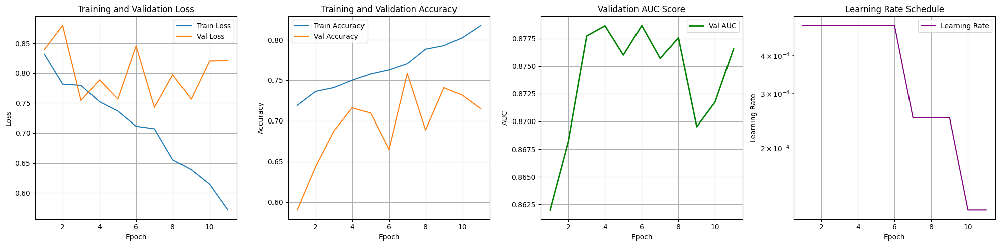

🎯 Extended Training Summary:
Best epoch: 6
Best AUC: 0.8787
Best Accuracy: 0.6650
Final AUC: 0.8766


In [38]:
# Convert history to DataFrame for easier plotting
history_df = pd.DataFrame(extended_history)

plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.plot(history_df['epoch'], history_df['train_loss'], label='Train Loss')
plt.plot(history_df['epoch'], history_df['val_loss'], label='Val Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.subplot(1, 4, 2)
plt.plot(history_df['epoch'], history_df['train_acc'], label='Train Accuracy')
plt.plot(history_df['epoch'], history_df['val_acc'], label='Val Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.subplot(1, 4, 3)
plt.plot(history_df['epoch'], history_df['val_auc'], label='Val AUC', color='green', linewidth=2)
plt.title('Validation AUC Score')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.legend()
plt.grid(True)

plt.subplot(1, 4, 4)
plt.plot(history_df['epoch'], history_df['lr'], label='Learning Rate', color='purple')
plt.title('Learning Rate Schedule')
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.legend()
plt.grid(True)
plt.yscale('log')

plt.tight_layout()
plt.show()

# Print final results
best_epoch = history_df['val_auc'].idxmax() + 1
print(f"🎯 Extended Training Summary:")
print(f"Best epoch: {best_epoch}")
print(f"Best AUC: {history_df['val_auc'].max():.4f}")
print(f"Best Accuracy: {history_df.loc[history_df['val_auc'].idxmax(), 'val_acc']:.4f}")
print(f"Final AUC: {history_df['val_auc'].iloc[-1]:.4f}")

In [39]:
# Load the best improved model
print("🚀 Loading improved model for error analysis...")
improved_checkpoint = torch.load('improved_pneumonia_model.pth', weights_only=False, map_location='cpu')
improved_model.load_state_dict(improved_checkpoint['model_state_dict'])

# Get predictions from improved model
print("🔍 Running predictions for error analysis...")
improved_model.eval()
all_predictions = []
all_probabilities = []
all_true_labels = []
all_patient_ids = []

with torch.no_grad():
    for batch_idx, (images, labels) in enumerate(tqdm(val_loader)):
        images, labels = images.to(device), labels.to(device)
        outputs = improved_model(images)
        probs = torch.sigmoid(outputs).cpu().numpy()
        preds = (probs > 0.5).astype(int)
        
        all_probabilities.extend(probs)
        all_predictions.extend(preds)
        all_true_labels.extend(labels.cpu().numpy())
        
        # Get patient IDs for this batch
        start_idx = batch_idx * val_loader.batch_size
        end_idx = start_idx + len(labels)
        batch_patient_ids = val_df.iloc[start_idx:end_idx]['patientId'].values
        all_patient_ids.extend(batch_patient_ids)

# Create error analysis DataFrame
error_df = pd.DataFrame({
    'patientId': all_patient_ids,
    'true_label': all_true_labels,
    'prediction': all_predictions,
    'probability': [p[0] for p in all_probabilities],
    'file_path': val_df['file_path'].values[:len(all_patient_ids)]
})

# Add error types
error_df['error_type'] = 'Correct'
error_df.loc[(error_df['true_label'] == 0) & (error_df['prediction'] == 1), 'error_type'] = 'False Positive'
error_df.loc[(error_df['true_label'] == 1) & (error_df['prediction'] == 0), 'error_type'] = 'False Negative'
error_df.loc[(error_df['true_label'] == 1) & (error_df['prediction'] == 1), 'error_type'] = 'True Positive'
error_df.loc[(error_df['true_label'] == 0) & (error_df['prediction'] == 0), 'error_type'] = 'True Negative'

print("📊 Error Distribution:")
error_counts = error_df['error_type'].value_counts()
print(error_counts)

# Calculate error rates
total_samples = len(error_df)
fp_count = error_counts.get('False Positive', 0)
fn_count = error_counts.get('False Negative', 0)

print(f"\n🎯 Error Rates:")
print(f"False Positive Rate: {fp_count/total_samples:.4f} ({fp_count}/{total_samples})")
print(f"False Negative Rate: {fn_count/total_samples:.4f} ({fn_count}/{total_samples})")
print(f"Overall Error Rate: {(fp_count + fn_count)/total_samples:.4f}")

🚀 Loading improved model for error analysis...
🔍 Running predictions for error analysis...


100%|██████████| 167/167 [00:49<00:00,  3.35it/s]

📊 Error Distribution:
error_type
True Negative     2420
False Positive    1715
True Positive     1129
False Negative      73
Name: count, dtype: int64

🎯 Error Rates:
False Positive Rate: 0.3213 (1715/5337)
False Negative Rate: 0.0137 (73/5337)
Overall Error Rate: 0.3350


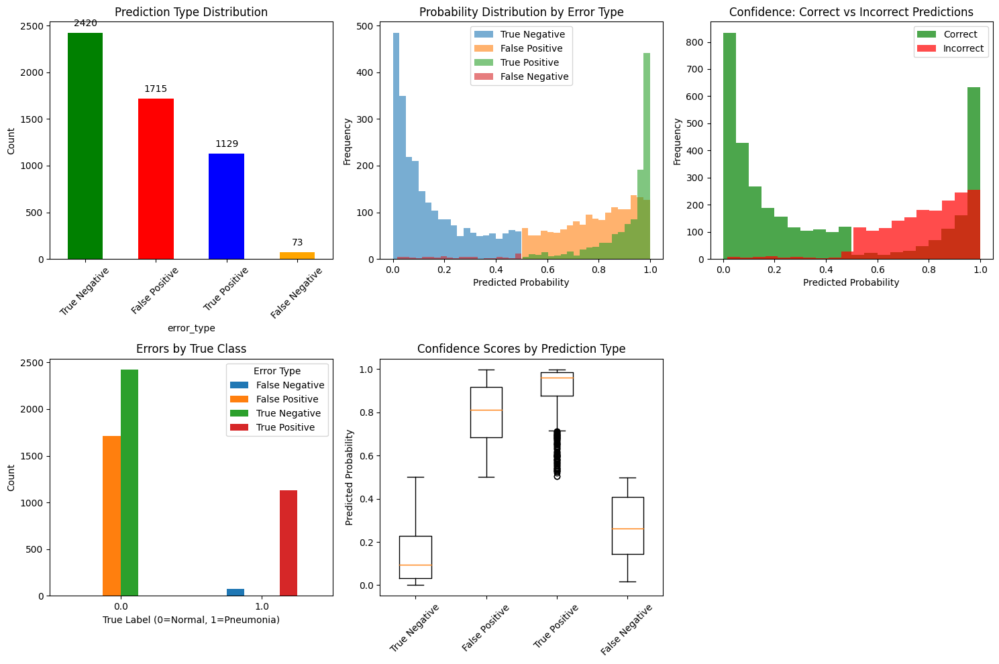

In [40]:
# Plot error analysis
plt.figure(figsize=(15, 10))

# Plot 1: Error type distribution
plt.subplot(2, 3, 1)
error_counts.plot(kind='bar', color=['green', 'red', 'blue', 'orange'])
plt.title('Prediction Type Distribution')
plt.ylabel('Count')
plt.xticks(rotation=45)
for i, count in enumerate(error_counts.values):
    plt.text(i, count + 50, str(count), ha='center', va='bottom')

# Plot 2: Probability distribution by error type
plt.subplot(2, 3, 2)
for error_type in error_df['error_type'].unique():
    subset = error_df[error_df['error_type'] == error_type]
    plt.hist(subset['probability'], alpha=0.6, label=error_type, bins=20)
plt.title('Probability Distribution by Error Type')
plt.xlabel('Predicted Probability')
plt.ylabel('Frequency')
plt.legend()

# Plot 3: Confidence analysis
plt.subplot(2, 3, 3)
correct_predictions = error_df[error_df['error_type'].str.contains('True')]
incorrect_predictions = error_df[error_df['error_type'].str.contains('False')]

plt.hist(correct_predictions['probability'], alpha=0.7, label='Correct', color='green', bins=20)
plt.hist(incorrect_predictions['probability'], alpha=0.7, label='Incorrect', color='red', bins=20)
plt.title('Confidence: Correct vs Incorrect Predictions')
plt.xlabel('Predicted Probability')
plt.ylabel('Frequency')
plt.legend()

# Plot 4: Error by true class
plt.subplot(2, 3, 4)
error_by_class = error_df.groupby('true_label')['error_type'].value_counts().unstack(fill_value=0)
error_by_class.plot(kind='bar', ax=plt.gca())
plt.title('Errors by True Class')
plt.xlabel('True Label (0=Normal, 1=Pneumonia)')
plt.ylabel('Count')
plt.legend(title='Error Type')
plt.xticks(rotation=0)

# Plot 5: Confidence scores for different outcomes
plt.subplot(2, 3, 5)
box_data = [error_df[error_df['error_type'] == et]['probability'] for et in error_df['error_type'].unique()]
plt.boxplot(box_data, labels=error_df['error_type'].unique())
plt.title('Confidence Scores by Prediction Type')
plt.ylabel('Predicted Probability')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [41]:
# Analyze the most confident errors
print("🔍 Analyzing most confident errors...")

# Most confident false positives (model very sure it's pneumonia, but it's normal)
false_positives = error_df[error_df['error_type'] == 'False Positive']
most_confident_fp = false_positives.nlargest(5, 'probability')

# Most confident false negatives (model very sure it's normal, but it's pneumonia)  
false_negatives = error_df[error_df['error_type'] == 'False Negative']
most_confident_fn = false_negatives.nsmallest(5, 'probability')

print("\n🚨 Most Confident False Positives (Normal misclassified as Pneumonia):")
for idx, row in most_confident_fp.iterrows():
    print(f"  Probability: {row['probability']:.4f} | Patient: {row['patientId'][:8]}...")

print("\n🚨 Most Confident False Negatives (Pneumonia misclassified as Normal):")
for idx, row in most_confident_fn.iterrows():
    print(f"  Probability: {row['probability']:.4f} | Patient: {row['patientId'][:8]}...")

# Analyze borderline cases
borderline_cases = error_df[(error_df['probability'] > 0.4) & (error_df['probability'] < 0.6)]
print(f"\n🎯 Borderline cases (0.4 < probability < 0.6): {len(borderline_cases)}")
print("These are the cases where the model is most uncertain")

# Save detailed error analysis
error_analysis_path = 'detailed_error_analysis.csv'
error_df.to_csv(error_analysis_path, index=False)
print(f"\n💾 Detailed error analysis saved to: {error_analysis_path}")

🔍 Analyzing most confident errors...

🚨 Most Confident False Positives (Normal misclassified as Pneumonia):
  Probability: 0.9987 | Patient: 64e4cfd4...
  Probability: 0.9983 | Patient: 64d4a708...
  Probability: 0.9981 | Patient: 4b3c30de...
  Probability: 0.9979 | Patient: 6478344f...
  Probability: 0.9977 | Patient: c9b15eb0...

🚨 Most Confident False Negatives (Pneumonia misclassified as Normal):
  Probability: 0.0168 | Patient: 2bd2356b...
  Probability: 0.0244 | Patient: b2b15756...
  Probability: 0.0246 | Patient: bf506a9c...
  Probability: 0.0283 | Patient: 05744f1d...
  Probability: 0.0544 | Patient: 3ed5e37a...

🎯 Borderline cases (0.4 < probability < 0.6): 503
These are the cases where the model is most uncertain

💾 Detailed error analysis saved to: detailed_error_analysis.csv


🖼️ Displaying sample error cases...

❌ False Positives (Normal classified as Pneumonia):


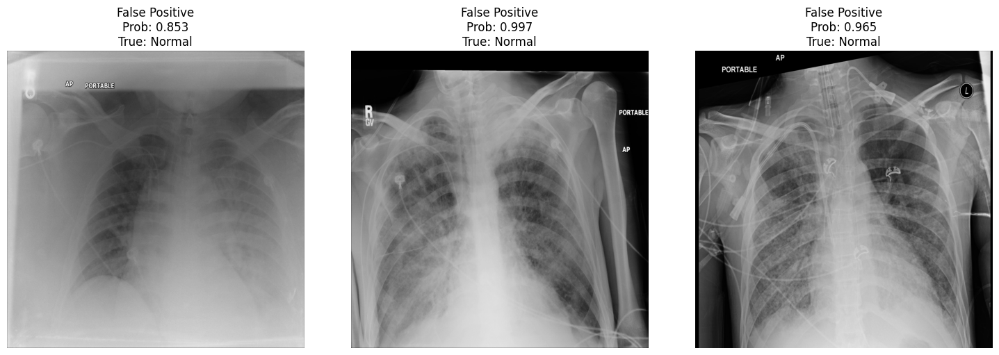


❌ False Negatives (Pneumonia classified as Normal):


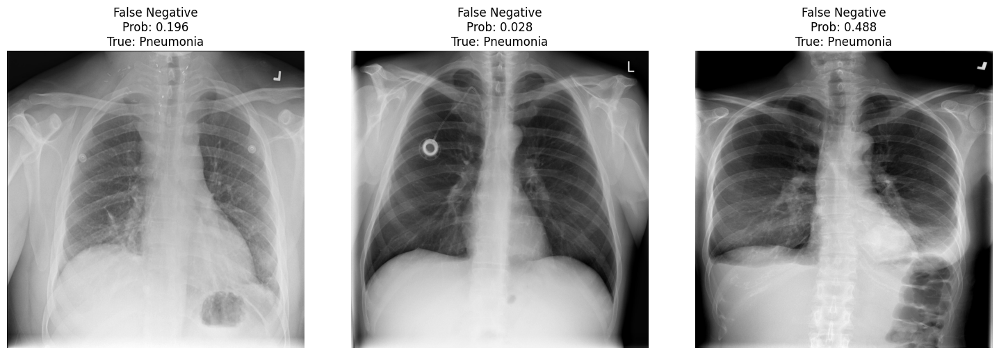


✅ True Positives (Correct Pneumonia detections):


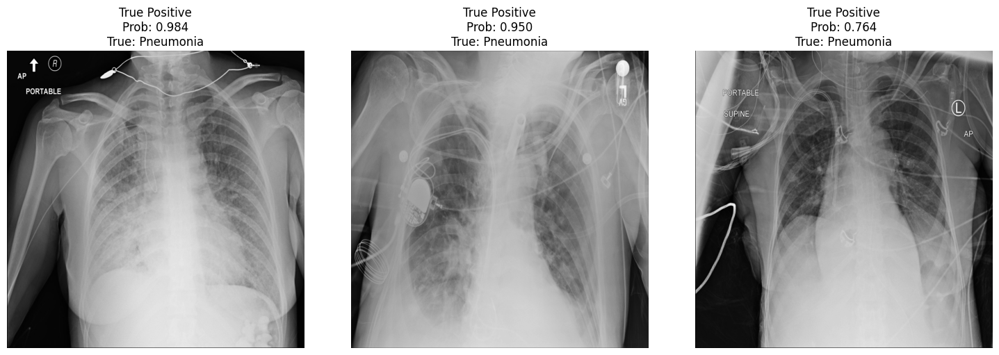


✅ True Negatives (Correct Normal detections):


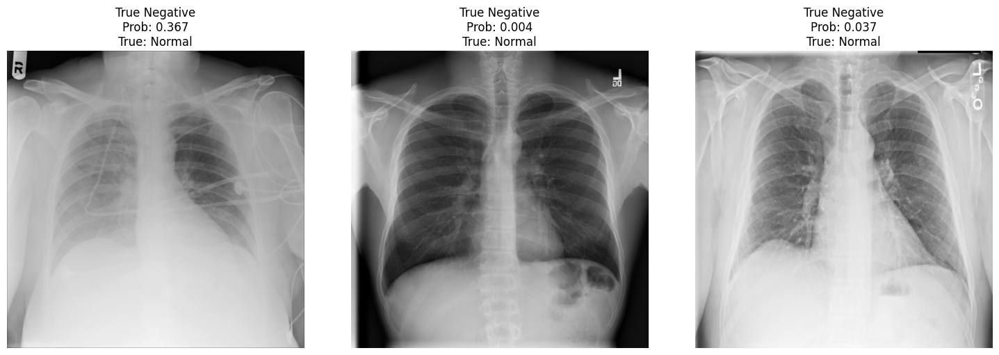

In [42]:
def display_error_cases(error_df, error_type, num_cases=3):
    """Display sample images for specific error types"""
    cases = error_df[error_df['error_type'] == error_type].head(num_cases)
    
    if len(cases) == 0:
        print(f"No {error_type} cases found")
        return
    
    fig, axes = plt.subplots(1, num_cases, figsize=(15, 5))
    if num_cases == 1:
        axes = [axes]
    
    for i, (idx, row) in enumerate(cases.iterrows()):
        # Load and display image
        dicom = pydicom.dcmread(row['file_path'])
        image = dicom.pixel_array
        image = (image - image.min()) / (image.max() - image.min()) * 255.0
        image = image.astype(np.uint8)
        
        axes[i].imshow(image, cmap='gray')
        axes[i].set_title(f'{error_type}\nProb: {row["probability"]:.3f}\nTrue: {"Pneumonia" if row["true_label"] == 1 else "Normal"}')
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

print("🖼️ Displaying sample error cases...")

# Show examples of different error types
print("\n❌ False Positives (Normal classified as Pneumonia):")
display_error_cases(error_df, 'False Positive', 3)

print("\n❌ False Negatives (Pneumonia classified as Normal):")
display_error_cases(error_df, 'False Negative', 3)

print("\n✅ True Positives (Correct Pneumonia detections):")
display_error_cases(error_df, 'True Positive', 3)

print("\n✅ True Negatives (Correct Normal detections):")
display_error_cases(error_df, 'True Negative', 3)

In [43]:
import torch.nn.functional as F

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        
        # Hook into the target layer
        self.target_layer.register_forward_hook(self.save_activation)
        self.target_layer.register_full_backward_hook(self.save_gradient)
    
    def save_activation(self, module, input, output):
        self.activations = output.detach()
    
    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()
    
    def generate_cam(self, input_tensor, target_class=None):
        # Forward pass
        output = self.model(input_tensor)
        
        if target_class is None:
            target_class = output.argmax(dim=1).item()
        
        # Zero gradients and do backward pass for target class
        self.model.zero_grad()
        output.backward(gradient=torch.ones_like(output), retain_graph=True)
        
        # Get gradients and activations
        gradients = self.gradients[0].cpu().numpy()
        activations = self.activations[0].cpu().numpy()
        
        # Global average pooling of gradients
        weights = np.mean(gradients, axis=(1, 2))
        
        # Weighted combination of activation maps
        cam = np.zeros(activations.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            cam += w * activations[i, :, :]
        
        # Apply ReLU and normalize
        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, (input_tensor.shape[3], input_tensor.shape[2]))
        cam = cam - np.min(cam)
        cam = cam / np.max(cam)
        
        return cam, output

# Set up Grad-CAM for our model
print("🎨 Setting up Grad-CAM visualization...")

# Use the last convolutional layer of ResNet18
target_layer = improved_model.backbone.layer4[1].conv2
grad_cam = GradCAM(improved_model, target_layer)

print("✅ Grad-CAM ready!")

🎨 Setting up Grad-CAM visualization...
✅ Grad-CAM ready!


🔍 Visualizing most confident false positives...


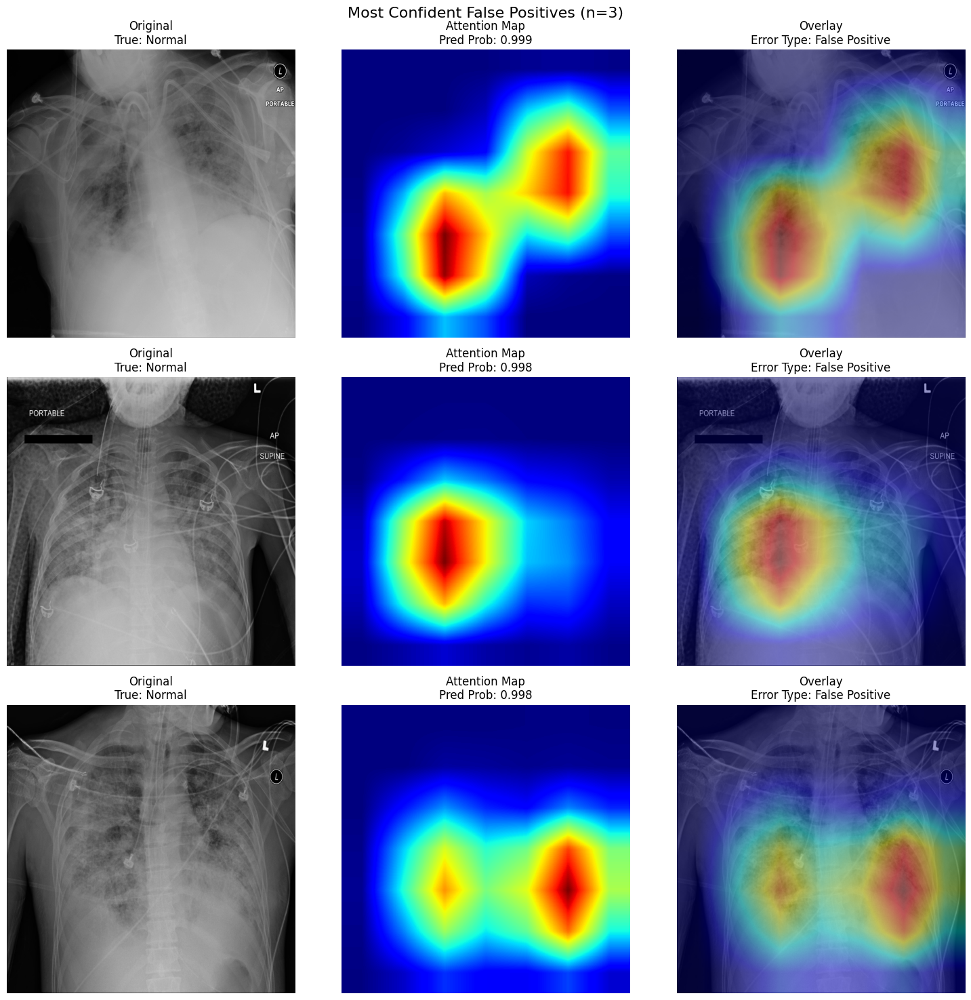

🔍 Visualizing most confident false negatives...


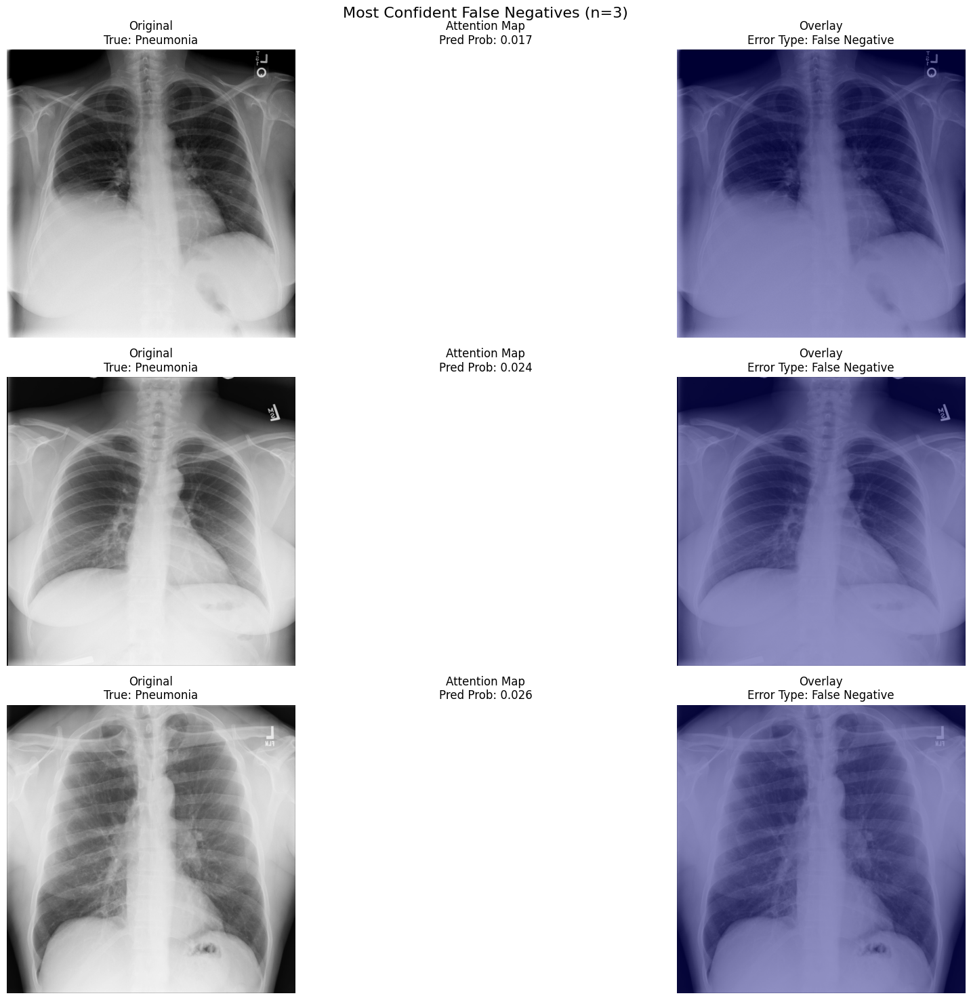

🔍 Visualizing borderline cases...


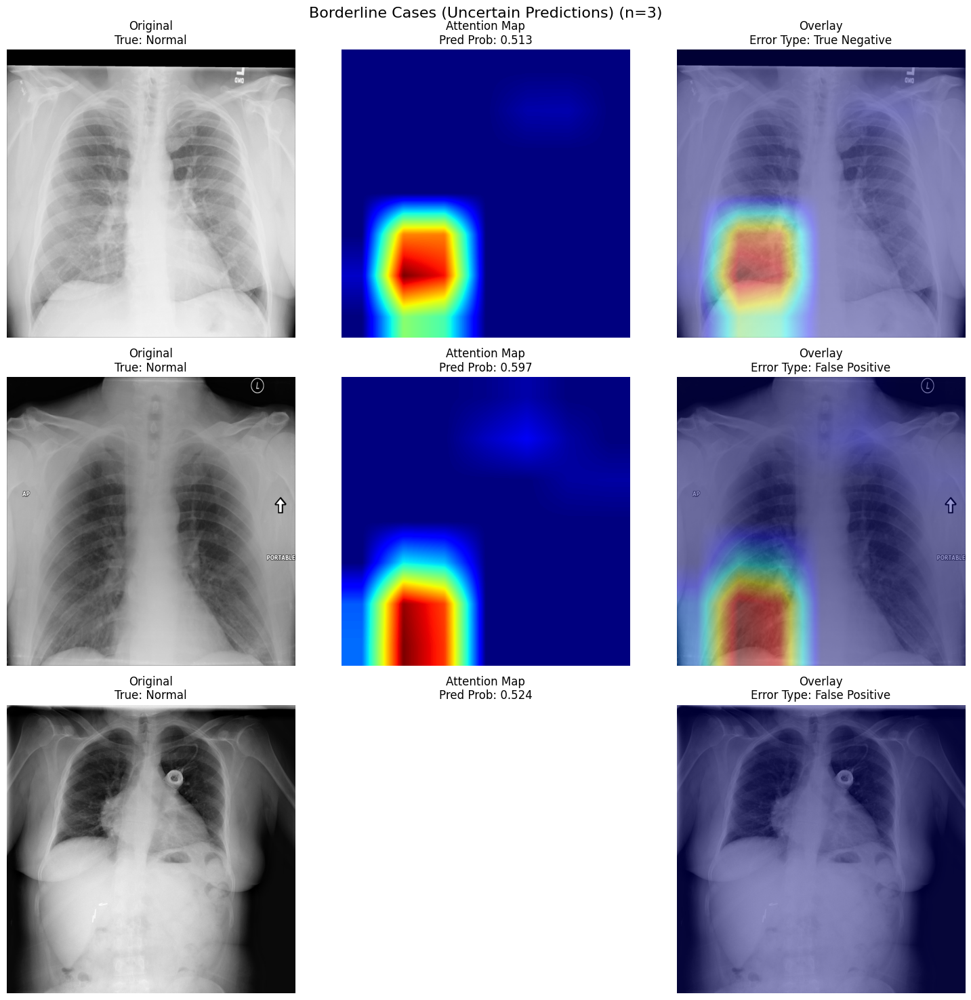

🔍 Visualizing correct predictions for comparison...


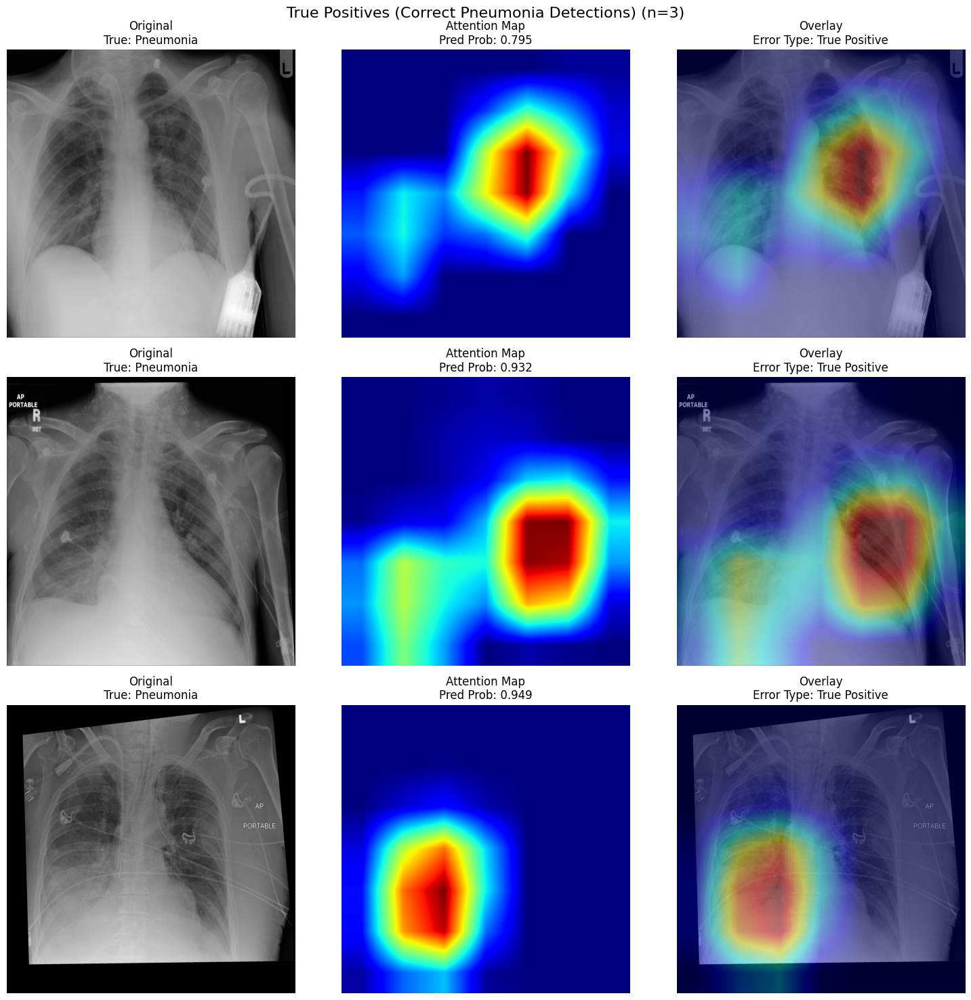

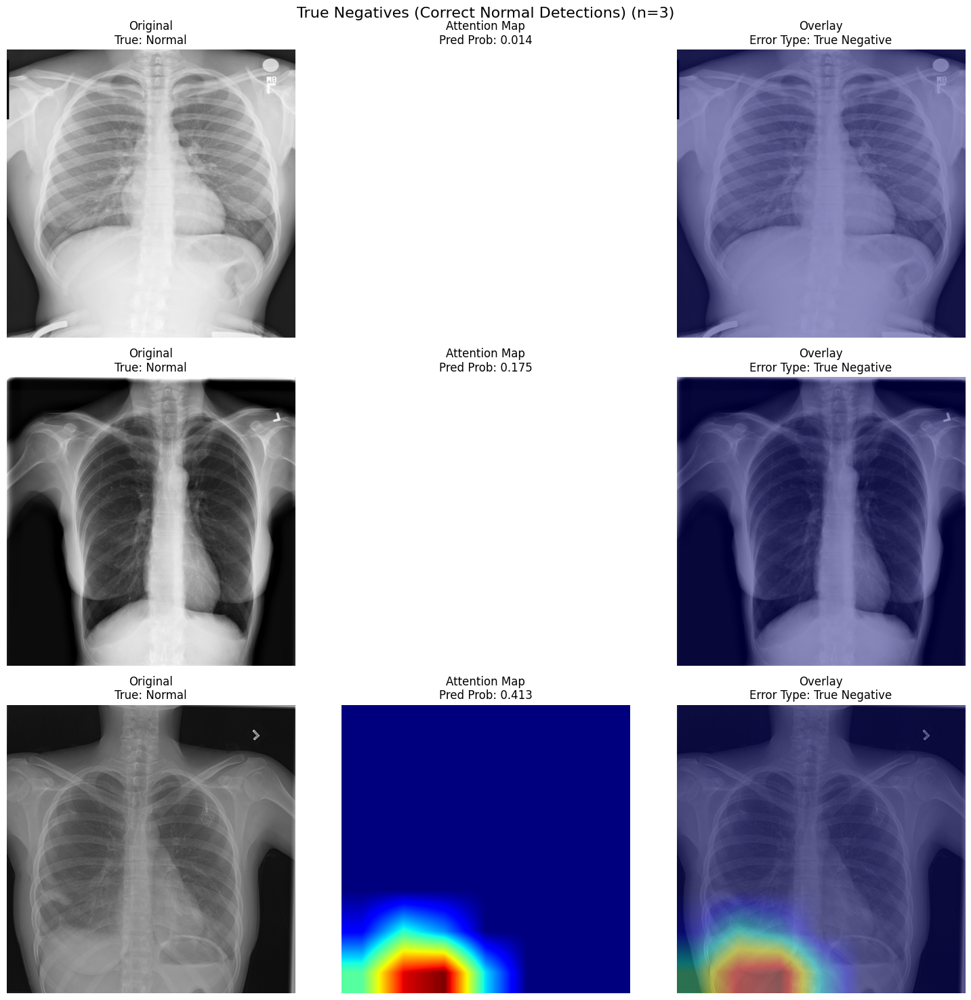

In [44]:
def visualize_gradcam_for_cases(cases_df, grad_cam, transform, device, num_cases=3, title="Grad-CAM Analysis"):
    """Visualize what the model focuses on for specific cases"""
    
    cases = cases_df.head(num_cases)
    fig, axes = plt.subplots(num_cases, 3, figsize=(15, 5*num_cases))
    if num_cases == 1:
        axes = [axes]
    
    for i, (idx, row) in enumerate(cases.iterrows()):
        try:
            # Load and preprocess image
            dicom = pydicom.dcmread(row['file_path'])
            original_image = dicom.pixel_array
            
            # Normalize for display
            display_image = (original_image - original_image.min()) / (original_image.max() - original_image.min())
            display_image = (display_image * 255).astype(np.uint8)
            
            # Preprocess for model
            image_rgb = Image.fromarray(original_image).convert('RGB')
            input_tensor = transform(image_rgb).unsqueeze(0).to(device)
            
            # Generate CAM
            cam, model_output = grad_cam.generate_cam(input_tensor)
            probability = torch.sigmoid(model_output).item()
            
            # Create heatmap overlay
            heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
            heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
            heatmap = cv2.resize(heatmap, (original_image.shape[1], original_image.shape[0]))
            
            # Blend with original image
            original_rgb = np.stack([display_image] * 3, axis=-1)
            superimposed = cv2.addWeighted(original_rgb, 0.6, heatmap, 0.4, 0)
            
            # Plotting
            axes[i][0].imshow(display_image, cmap='gray')
            axes[i][0].set_title(f"Original\nTrue: {'Pneumonia' if row['true_label']==1 else 'Normal'}")
            axes[i][0].axis('off')
            
            axes[i][1].imshow(cam, cmap='jet')
            axes[i][1].set_title(f"Attention Map\nPred Prob: {probability:.3f}")
            axes[i][1].axis('off')
            
            axes[i][2].imshow(superimposed)
            axes[i][2].set_title(f"Overlay\nError Type: {row['error_type']}")
            axes[i][2].axis('off')
            
        except Exception as e:
            print(f"Error processing case {row['patientId']}: {e}")
            for j in range(3):
                axes[i][j].text(0.5, 0.5, f"Error loading image", 
                               ha='center', va='center', transform=axes[i][j].transAxes)
                axes[i][j].set_title("Error")
                axes[i][j].axis('off')
    
    plt.suptitle(f"{title} (n={len(cases)})", fontsize=16)
    plt.tight_layout()
    plt.show()

# Analyze the most interesting cases
print("🔍 Visualizing most confident false positives...")
most_confident_fp = false_positives.nlargest(3, 'probability')
visualize_gradcam_for_cases(most_confident_fp, grad_cam, val_transforms, device, 
                           title="Most Confident False Positives")

print("🔍 Visualizing most confident false negatives...")
most_confident_fn = false_negatives.nsmallest(3, 'probability')
visualize_gradcam_for_cases(most_confident_fn, grad_cam, val_transforms, device,
                           title="Most Confident False Negatives")

print("🔍 Visualizing borderline cases...")
borderline_cases_sample = borderline_cases.sample(3, random_state=42)
visualize_gradcam_for_cases(borderline_cases_sample, grad_cam, val_transforms, device,
                           title="Borderline Cases (Uncertain Predictions)")

print("🔍 Visualizing correct predictions for comparison...")
true_positives = error_df[error_df['error_type'] == 'True Positive'].sample(3, random_state=42)
visualize_gradcam_for_cases(true_positives, grad_cam, val_transforms, device,
                           title="True Positives (Correct Pneumonia Detections)")

true_negatives = error_df[error_df['error_type'] == 'True Negative'].sample(3, random_state=42)
visualize_gradcam_for_cases(true_negatives, grad_cam, val_transforms, device,
                           title="True Negatives (Correct Normal Detections)")

📊 Analyzing attention patterns across error types...
Analyzing attention patterns for False Positive...
Analyzing attention patterns for False Negative...
Analyzing attention patterns for True Positive...
Analyzing attention patterns for True Negative...


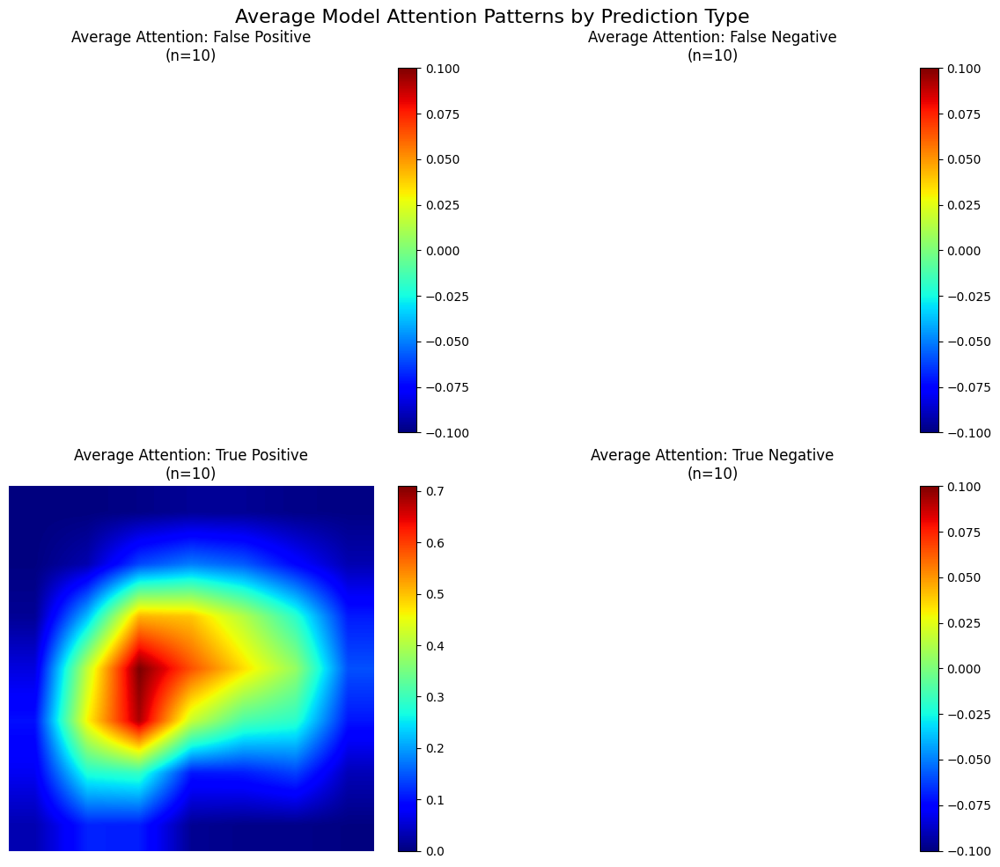

In [45]:
def analyze_attention_patterns(error_df, grad_cam, transform, device, sample_size=5):
    """Analyze what regions the model focuses on for different error types"""
    
    error_types = ['False Positive', 'False Negative', 'True Positive', 'True Negative']
    attention_maps = {et: [] for et in error_types}
    
    for error_type in error_types:
        print(f"Analyzing attention patterns for {error_type}...")
        samples = error_df[error_df['error_type'] == error_type].sample(
            min(sample_size, len(error_df[error_df['error_type'] == error_type])), 
            random_state=42
        )
        
        for _, row in samples.iterrows():
            try:
                dicom = pydicom.dcmread(row['file_path'])
                original_image = dicom.pixel_array
                
                image_rgb = Image.fromarray(original_image).convert('RGB')
                input_tensor = transform(image_rgb).unsqueeze(0).to(device)
                
                cam, _ = grad_cam.generate_cam(input_tensor)
                attention_maps[error_type].append(cam)
                
            except Exception as e:
                print(f"  Error processing {row['patientId']}: {e}")
    
    # Plot average attention maps
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    axes = axes.ravel()
    
    for i, error_type in enumerate(error_types):
        if attention_maps[error_type]:
            avg_attention = np.mean(attention_maps[error_type], axis=0)
            im = axes[i].imshow(avg_attention, cmap='jet')
            axes[i].set_title(f'Average Attention: {error_type}\n(n={len(attention_maps[error_type])})')
            axes[i].axis('off')
            plt.colorbar(im, ax=axes[i])
        else:
            axes[i].text(0.5, 0.5, f"No data for {error_type}", 
                        ha='center', va='center', transform=axes[i].transAxes)
            axes[i].set_title(f'{error_type} (no data)')
            axes[i].axis('off')
    
    plt.suptitle("Average Model Attention Patterns by Prediction Type", fontsize=16)
    plt.tight_layout()
    plt.show()
    
    return attention_maps

print("📊 Analyzing attention patterns across error types...")
attention_patterns = analyze_attention_patterns(error_df, grad_cam, val_transforms, device, 10)

🎯 Exploring specific interesting cases...
🔍 Detailed Analysis for Patient: 64e4cfd4-7e2f-4f1e-863a-1fcfc3d40dd2
True Label: Normal
Prediction: Pneumonia
Probability: 0.9987
Error Type: False Positive


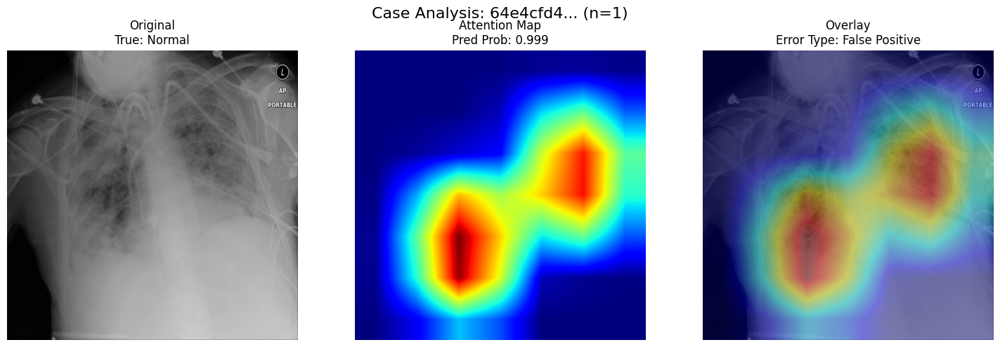

🔍 Detailed Analysis for Patient: 2bd2356b-305a-4726-9a47-034da8f5f2ee
True Label: Pneumonia
Prediction: Normal
Probability: 0.0168
Error Type: False Negative


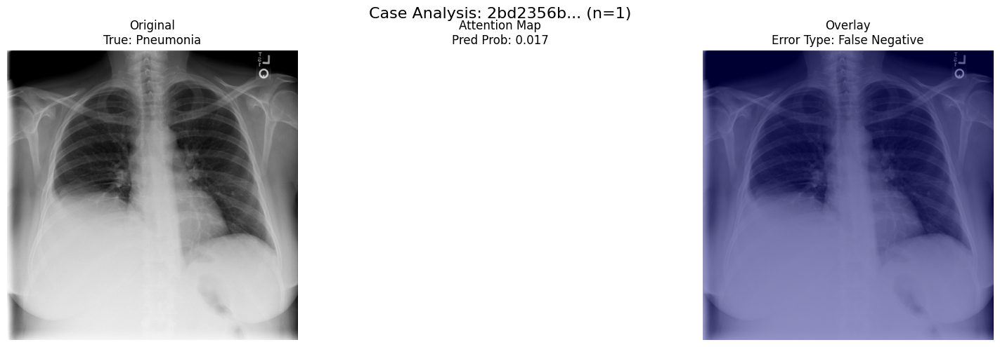

🔍 Detailed Analysis for Patient: 27d1956f-5e94-4fa3-b1ee-0fb2896d9c7d
True Label: Normal
Prediction: Normal
Probability: 0.4140
Error Type: True Negative


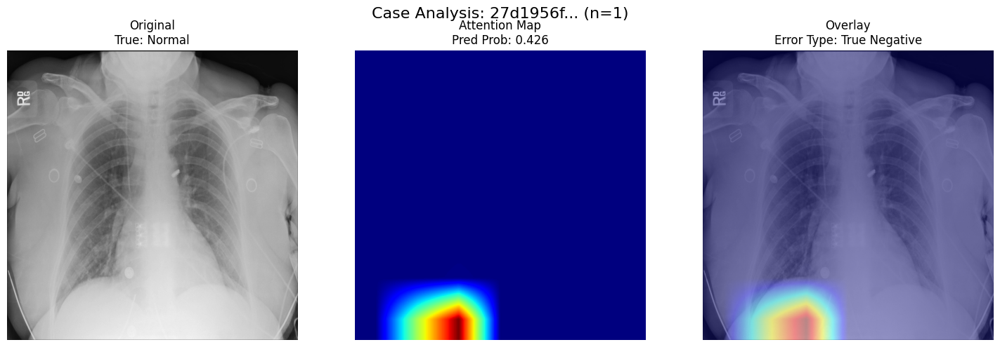

In [46]:
# Let's create a function to explore specific cases interactively
def explore_specific_case(patient_id, error_df, grad_cam, transform, device):
    """Explore a specific case in detail"""
    case = error_df[error_df['patientId'] == patient_id]
    
    if len(case) == 0:
        print(f"Case {patient_id} not found in error analysis")
        return
    
    row = case.iloc[0]
    
    print(f"🔍 Detailed Analysis for Patient: {patient_id}")
    print(f"True Label: {'Pneumonia' if row['true_label'] == 1 else 'Normal'}")
    print(f"Prediction: {'Pneumonia' if row['prediction'] == 1 else 'Normal'}")
    print(f"Probability: {row['probability']:.4f}")
    print(f"Error Type: {row['error_type']}")
    
    # Visualize with Grad-CAM
    visualize_gradcam_for_cases(case, grad_cam, transform, device, 1, 
                               title=f"Case Analysis: {patient_id[:8]}...")

# Let's explore some interesting cases from our error analysis
print("🎯 Exploring specific interesting cases...")

# Most confident false positive
most_confident_fp_id = most_confident_fp.iloc[0]['patientId']
explore_specific_case(most_confident_fp_id, error_df, grad_cam, val_transforms, device)

# Most confident false negative  
most_confident_fn_id = most_confident_fn.iloc[0]['patientId']
explore_specific_case(most_confident_fn_id, error_df, grad_cam, val_transforms, device)

# A borderline case
borderline_id = borderline_cases.iloc[0]['patientId']
explore_specific_case(borderline_id, error_df, grad_cam, val_transforms, device)